# CAPSTONE PROJECT

by Joyce Ooi

# Notebook 1: DATA CLEANING, EDA AND PREPROCESSING

This notebook contains the Problem Statement and code for data cleaning and EDA

### Contents

- [Importing of Libraries](#Importing-of-Libraries)
- [Data Import](#Data-Import)
- [Data Preparation](#Data-Preparation)
- [Preliminary Analysis and Data Cleaning](#Preliminary-Analysis-and-Data-Cleaning)
- [EDA](#EDA)
   
    * [Tesla](#Tesla)
    * [Microsoft](#Microsoft)
        
- **FANNG Stocks**
    * [Apple](#Apple)
    * [Google](#Google)
    * [Netflix](#Netflix)
    * [Amazon](#Amazon)
    * [Facebook](#Facebook)
    
- **Cloud Stocks**
    * [Adobe](#Adobe)
    * [Cloudera](#Cloudera)
    * [Equinix](#Equinix)
    
- **Indexes**
    * [Dow Jones Index](#DJI)
    * [Deutscher Aktien Index](#DAX)
    * [Cotation Assistee Continu](#CAC)

- **Sentiment Analysis on Headlines**
- [Data Export](#Data-Export)



# Problem Statement

Problem Statement:

There is difficulty in selecting stocks with consistent Return on Investment (ROI) due to market volatility. We want to identify stocks that allow us to predict consistent returns and which might also allow portfolio diversification, by identifying stocks that correlate to each other or correlate to economic indicators.

We want to train a classifier to predict whether a stock price will generate positive or negative intraday returns. Success will be evaluated  via F1 score as well as Accuracy and AUC Scores.

We want to be able to predict whether stocks in this portfolio will generate positive or negative returns and adjust our stock selection accordingly.

We will be using a 2-pronged approach:

**Approach 1**: Auto regression, ie. using previous timepoints as predictors of outcome and as features (e.g. previous days closing price and moving averages). 

**Approach 2**: News sentiment and twitter sentiment

The aim of this project is to build a predictive model that would predict whether Tesla stock would close up or down for a given day based on the information on the intraday price of previous days as well as the movements in regional indexes, news related to Tesla stock as well as Twitter feeds by its CEO Elon Musk.

Part 1 : At the initial ideas stage we identified 2 groups of stocks to investigate and predict before settling on Tesla. The two options were <br> 
1) FANNG stocks versus Cloud stocks (Co-relation with each other and co-relation to variables such as previous day percentage changes in DJI, current percentage changes in regional indexes (CAC, DAX) and news headlines related to eack stock) <br>2) Any 2 stocks exhibiting a positive or negative co-relation.

Part 2 is an initial analysis and cleaning of the csv files. It is also the first checkpoint with EDA. Sentiment analysis using VADAR was performed separately on all portfolio stocks based on online news articles such as Yahoo. These were imported and further preprocessed to convert all compound scores into -1 or 1.News headlines for all stocks was taken from: https://ycharts.com/companies/news

Part 3 is the selection process whereby we narrowed our selection down to Tesla to make predictions. Tesla was selected due to the frequency of Elon Musk's Twitter feeds and strong Twitter following which we felt could have impact on Tesla's share price. Tesla's headline sentiments also showed a higher correlation to opening change and percent change compared to Facebook or Google. Furthermore, Tesla stock showed little correlation to the other FAANG stocks which made it suitable for portfolio diversification.

Part 4 is the modelling process, where we selected a series of models to find the best Classifier. These included:
- Logistic Regression
- KNeighboursClassifier
- AdaboostClassifier
- DecisionTree Classifier
- RandomForestClassfier
- ExtraTreesClassifier

Part 5 is the conclusion of our project with the process from start to finish outlining all the steps taken, and the presentation and analysis of the predictive model /models Notebook.

Our best classifier is **Random Forest*** which was able to predict Tesla's share price with an accuracy 0.79% (compared to baseline of about 51%). The Random Forest model also achieved the following scores:

- Accuracy:0.7896995708154506
- Precision:0.7554585152838428
- Sensitivity:0.6232558139534884
- Specificity:0.7768924302788844
- Recall:0.8046511627906977
- F1 Score:0.7792792792792792 




# Importing of Libraries

In [1]:
#All libraries used have been added here
import pandas as pd
import numpy as np
import re

import nltk
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import RegexpTokenizer
from nltk.stem.porter import PorterStemmer
from nltk.corpus import stopwords
from bs4 import BeautifulSoup

from functools import reduce

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier

from sklearn.metrics import confusion_matrix, roc_auc_score, accuracy_score
from sklearn.pipeline import Pipeline
from datetime import datetime

from keras.models import Sequential
from keras.layers import Dense, Dropout, GRU
from keras.optimizers import Adam
from keras. preprocessing.sequence import TimeseriesGenerator


import statsmodels.api as sm
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose


import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('fivethirtyeight')

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

from nltk.corpus import stopwords
nltk.download('stopwords')
import csv


Using TensorFlow backend.
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/joyceooi/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


# Data Import

In [2]:
apple=pd.read_csv('./datasets/apple.csv')
tsla=pd.read_csv('./datasets/tesla.csv')
google=pd.read_csv('./datasets/google.csv')
nflx=pd.read_csv('./datasets/nflx.csv')
fb=pd.read_csv('./datasets/fb.csv')
amazon=pd.read_csv('./datasets/amazon.csv')
microsoft=pd.read_csv('./datasets/microsoft.csv')
adobe=pd.read_csv('./datasets/adobe.csv')
cloudera=pd.read_csv('./datasets/cloudera.csv')
equinix=pd.read_csv('./datasets/equinix.csv')
dji=pd.read_csv('./datasets/dji.csv')
dax=pd.read_csv('./datasets/dax.csv')
cac=pd.read_csv('./datasets/cac.csv')


# Data Preparation

In [3]:
#displaying all rows and columns to allow comprehensive search of best features
pd.set_option('display.max_columns', 1000)
pd.set_option('display.max_rows', 1000)

# Preliminary Analysis and Date Cleaning

# APPLE

In [399]:
apple.tail()

,date,apple_close,open,high,low,apple_vol,apple_intra_perc_change,apple_intra_returns,apple_pct_change,apple_pct_returns,apple_previous_close,apple_opening_change,apple_opening_returns
2513,2010-04-05,34.07,33.57,34.07,33.54,170363601,-1.489425,-1,-0.004383,-1,33.71,-0.415307,-1
2514,2010-04-01,33.71,33.93,34.10,33.25,150568295,0.648394,1,-0.010566,-1,33.57,1.072386,1
2515,2010-03-31,33.57,33.64,33.80,33.49,107438412,0.208086,1,-0.004153,-1,33.69,-0.148412,-1
2516,2010-03-30,33.69,33.80,33.93,33.46,131326339,0.325444,1,0.003575,1,33.20,1.807229,1
2517,2010-03-29,33.20,33.29,33.41,33.09,130887089,0.270351,1,-0.014544,-1,NaN,NaN,-1


In [5]:
apple.dtypes

Date           object
Close/Last    float64
Open          float64
High          float64
Low           float64
Volume          int64
dtype: object

In [6]:
apple.isnull().sum()

Date          0
Close/Last    0
Open          0
High          0
Low           0
Volume        0
dtype: int64

In [7]:
apple.columns = [x.lower() for x in apple.columns]

In [8]:
apple['date'] = pd.to_datetime(apple['date'])

In [9]:
apple.rename(columns={'close/last': 'apple_close','volume': 'apple_vol'}, inplace=True)

In [10]:
apple.head()

,date,apple_close,open,high,low,apple_vol
0,2020-03-27,247.74,252.75,255.87,247.05,51054150
1,2020-03-26,258.44,246.52,258.68,246.36,63140170
2,2020-03-25,245.52,250.75,258.25,244.30,75900510
3,2020-03-24,246.88,236.36,247.69,234.30,71882770
4,2020-03-23,224.37,228.08,228.50,212.61,84188210


**Intraday Returns (Open-Close)**

In [12]:
apple['apple_intra_perc_change']=((apple['open']-apple['apple_close']) / apple['open'])*100

In [13]:
apple['apple_intra_returns'] = np.where(apple['apple_intra_perc_change']>0, 1, -1)

**Percent Returns (Current Close-Previous Close)**

In [14]:
apple_pct_change=pd.DataFrame(apple.apple_close.pct_change())

In [15]:
apple = apple.assign(apple_pct_change=apple_pct_change.values)

In [16]:
apple['apple_pct_returns'] = np.where(apple['apple_pct_change']>0, 1, -1)

#### Shift Up Previous Close to Compare with today's Open price

In [17]:
apple.loc[:,'apple_previous_close'] = apple['apple_close'].shift(-1)

In [18]:
apple['apple_opening_change']=((apple['open']-apple['apple_previous_close'])/apple['apple_previous_close'])*100

In [19]:
apple['apple_opening_returns'] = np.where(apple['apple_opening_change']>0, 1, -1)

In [20]:
apple.dtypes

date                       datetime64[ns]
apple_close                       float64
open                              float64
high                              float64
low                               float64
apple_vol                           int64
apple_intra_perc_change           float64
apple_intra_returns                 int64
apple_pct_change                  float64
apple_pct_returns                   int64
apple_previous_close              float64
apple_opening_change              float64
apple_opening_returns               int64
dtype: object

#### Sort By Date (Apple)

In [21]:
apple.head(100)
apple_index=apple.sort_values(by='date',ascending=True)

In [22]:
apple_index=apple_index.reset_index(drop=True)

In [23]:
apple_index

,date,apple_close,open,high,low,apple_vol,apple_intra_perc_change,apple_intra_returns,apple_pct_change,apple_pct_returns,apple_previous_close,apple_opening_change,apple_opening_returns
0,2010-03-29,33.20,33.29,33.41,33.09,130887089,0.270351,1,-0.014544,-1,NaN,NaN,-1
1,2010-03-30,33.69,33.80,33.93,33.46,131326339,0.325444,1,0.003575,1,33.20,1.807229,1
2,2010-03-31,33.57,33.64,33.80,33.49,107438412,0.208086,1,-0.004153,-1,33.69,-0.148412,-1
3,2010-04-01,33.71,33.93,34.10,33.25,150568295,0.648394,1,-0.010566,-1,33.57,1.072386,1
4,2010-04-05,34.07,33.57,34.07,33.54,170363601,-1.489425,-1,-0.004383,-1,33.71,-0.415307,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2513,2020-03-23,224.37,228.08,228.50,212.61,84188210,1.626622,1,-0.091178,-1,229.24,-0.506020,-1
2514,2020-03-24,246.88,236.36,247.69,234.30,71882770,-4.450838,-1,0.005539,1,224.37,5.343852,1
2515,2020-03-25,245.52,250.75,258.25,244.30,75900510,2.085743,1,-0.049992,-1,246.88,1.567563,1
2516,2020-03-26,258.44,246.52,258.68,246.36,63140170,-4.835307,-1,0.043190,1,245.52,0.407299,1


### Selecting Feature Columns

In [24]:
apple2=apple_index[['date', 'apple_close', 'apple_vol', 'apple_intra_perc_change',
                    'apple_intra_returns', 'apple_pct_change','apple_pct_returns', 
                    'apple_opening_change' ]]

### Creating Target Variable (Apple stock)

In [25]:
apple2['apple_target']=np.where(apple2['apple_pct_change']>0, 1, -1) #comparison with previous day

/Users/joyceooi/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [26]:
apple2['apple_intra_target']=np.where(apple2['apple_intra_perc_change']>0, 1, -1) #comparison with open same day

/Users/joyceooi/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [27]:
apple2['apple_open_target']=np.where(apple2['apple_opening_change']>0, 1, -1)#comparison of opening price with previous closing price

/Users/joyceooi/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [28]:
apple2.dropna(inplace=True)

/Users/joyceooi/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [29]:
apple2.head(100)

,date,apple_close,apple_vol,apple_intra_perc_change,apple_intra_returns,apple_pct_change,apple_pct_returns,apple_opening_change,apple_target,apple_intra_target,apple_open_target
1,2010-03-30,33.69,131326339,0.325444,1,0.003575,1,1.807229,1,1,1
2,2010-03-31,33.57,107438412,0.208086,1,-0.004153,-1,-0.148412,-1,1,-1
3,2010-04-01,33.71,150568295,0.648394,1,-0.010566,-1,1.072386,-1,1,1
4,2010-04-05,34.07,170363601,-1.489425,-1,-0.004383,-1,-0.415307,-1,-1,-1
5,2010-04-06,34.22,111431983,-0.558331,-1,-0.004364,-1,-0.117405,-1,-1,-1
6,2010-04-07,34.37,156909177,-0.350365,-1,0.002625,1,0.087668,1,-1,1
7,2010-04-08,34.28,142899723,0.203785,1,-0.007528,-1,-0.058190,-1,1,-1
8,2010-04-09,34.54,83443105,-0.144970,-1,-0.002023,-1,0.612602,-1,-1,1
9,2010-04-12,34.61,83236885,-0.028902,-1,-0.000578,-1,0.173712,-1,-1,1
10,2010-04-13,34.63,76184103,-0.231548,-1,-0.013390,-1,-0.173360,-1,-1,-1


In [30]:
apple2.to_csv('./datasets/preprocessed/apple2.csv')

# MICROSOFT

In [31]:
microsoft.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,3/29/2010,29.71,29.82,29.55,29.59,23.34,33336000
1,3/30/2010,29.63,29.86,29.50,29.77,23.48,34954800
2,3/31/2010,29.64,29.72,29.17,29.29,23.10,63760000
3,4/1/2010,29.35,29.54,28.62,29.16,23.00,74768100
4,4/5/2010,29.13,29.43,29.03,29.27,23.08,34331200


In [32]:
microsoft.dtypes

Date          object
Open         float64
High         float64
Low          float64
Close        float64
Adj Close    float64
Volume         int64
dtype: object

In [33]:
microsoft.isnull().sum()

Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64

In [34]:
microsoft.columns = [x.lower() for x in microsoft.columns]

In [35]:
microsoft.columns = [x.replace(' ', '_')for x in microsoft.columns]

In [36]:
microsoft['date'] = pd.to_datetime(microsoft['date'])

In [37]:
microsoft.drop('adj_close', axis=1, inplace=True)

In [38]:
microsoft.rename(columns={'close': 'msft_close', 'volume': 'msft_vol'}, inplace=True)

In [39]:
microsoft.head()

,date,open,high,low,msft_close,msft_vol
0,2010-03-29,29.71,29.82,29.55,29.59,33336000
1,2010-03-30,29.63,29.86,29.50,29.77,34954800
2,2010-03-31,29.64,29.72,29.17,29.29,63760000
3,2010-04-01,29.35,29.54,28.62,29.16,74768100
4,2010-04-05,29.13,29.43,29.03,29.27,34331200


**Intraday Returns (Open-Close)**

In [40]:
microsoft['msft_intra_perc_change']=((microsoft['open']-microsoft['msft_close']) / microsoft['open'])*100

In [41]:
microsoft['msft_intra_returns'] = np.where(microsoft['msft_intra_perc_change']>0, 1, -1)

**Percent Returns(Current Close-Previous Close)**

In [42]:
msft_pct_change=pd.DataFrame(microsoft.msft_close.pct_change())

In [43]:
 microsoft= microsoft.assign(msft_pct_change=msft_pct_change.values)

In [44]:
 microsoft['msft_pct_returns'] = np.where( microsoft['msft_pct_change']>0, 1, -1)

#### Shift Up Previous Close to Compare with today's Open price

In [45]:
microsoft.loc[:,'msft_previous_close']=microsoft['msft_close'].shift(1)

In [46]:
microsoft['msft_opening_change']=((microsoft['open']-microsoft['msft_previous_close'])/microsoft['msft_previous_close'])*100

In [47]:
microsoft['msft_opening_returns']=np.where(microsoft['msft_opening_change']>0,1,-1)

### Selecting Feature Columns

In [48]:
msft2= microsoft[['date', 'msft_close', 'msft_vol',  'msft_intra_perc_change',
                  'msft_intra_returns','msft_pct_change','msft_pct_returns',
                  'msft_previous_close', 'msft_opening_change','msft_opening_returns' ]]

### Creating Target Variable (Microsoft stock)

In [49]:
msft2['msft_target']=np.where(msft2['msft_pct_change']>0, 1, -1)

/Users/joyceooi/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [50]:
msft2['msft_intra_target']=np.where(msft2['msft_intra_perc_change']>0, 1, -1)

/Users/joyceooi/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [51]:
msft2['msft_open_target']=np.where(msft2['msft_opening_change']>0, 1, -1) #comparison of opening price with previous closing price

In [52]:
msft2.tail()

,date,msft_close,msft_vol,msft_intra_perc_change,msft_intra_returns,msft_pct_change,msft_pct_returns,msft_previous_close,msft_opening_change,msft_opening_returns,msft_target,msft_intra_target,msft_open_target
2513,2020-03-23,135.98,78975200,0.751770,1,-0.009975,-1,137.35,-0.247543,-1,-1,1,-1
2514,2020-03-24,148.34,82516700,-3.193043,-1,0.090896,1,135.98,5.714076,1,1,-1,1
2515,2020-03-25,146.92,75638200,1.336378,1,-0.009573,-1,148.34,0.384252,1,-1,1,1
2516,2020-03-26,156.11,64568100,-5.195418,-1,0.062551,1,146.92,1.007351,1,1,-1,1
2517,2020-03-27,149.70,56999700,1.350906,1,-0.041061,-1,156.11,-2.792902,-1,-1,1,-1


In [53]:
msft2.dropna(inplace=True)

In [54]:
msft2.to_csv('./datasets/preprocessed/msft2.csv')

# TSLA

In [55]:
tsla.head(1000)

,Date,Open,High,Low,Close,Adj Close,Volume
0,2010-06-29,19.000000,25.000000,17.540001,23.889999,23.889999,18766300
1,2010-06-30,25.790001,30.420000,23.299999,23.830000,23.830000,17187100
2,2010-07-01,25.000000,25.920000,20.270000,21.959999,21.959999,8218800
3,2010-07-02,23.000000,23.100000,18.709999,19.200001,19.200001,5139800
4,2010-07-06,20.000000,20.000000,15.830000,16.110001,16.110001,6866900
5,2010-07-07,16.400000,16.629999,14.980000,15.800000,15.800000,6921700
6,2010-07-08,16.139999,17.520000,15.570000,17.459999,17.459999,7711400
7,2010-07-09,17.580000,17.900000,16.549999,17.400000,17.400000,4050600
8,2010-07-12,17.950001,18.070000,17.000000,17.049999,17.049999,2202500
9,2010-07-13,17.389999,18.639999,16.900000,18.139999,18.139999,2680100


In [56]:
tsla.dtypes

Date          object
Open         float64
High         float64
Low          float64
Close        float64
Adj Close    float64
Volume         int64
dtype: object

In [57]:
tsla.isnull().sum()

Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64

In [58]:
tsla.columns = [x.replace(' ', '_')for x in tsla.columns]

In [59]:
tsla.columns = [x.lower() for x in tsla.columns]

In [60]:
tsla['date'] = pd.to_datetime(tsla['date'])

In [61]:
tsla.rename(columns={'close': 'tsla_close', 'volume': 'tsla_vol'}, inplace=True)

In [62]:
tsla.drop('adj_close', axis=1, inplace=True)

**Intraday Returns (Open-Close)**

In [63]:
tsla['tsla_intra_perc_change']=((tsla['open']-tsla['tsla_close']) / tsla['open'])*100

In [64]:
tsla['tsla_intra_returns'] = np.where(tsla['tsla_intra_perc_change']>0, 1, -1)

**Percent Returns(Current Close-Previous Close)**

In [65]:
tsla_pct_change=pd.DataFrame(tsla.tsla_close.pct_change())

In [66]:
 tsla= tsla.assign(tsla_pct_change=tsla_pct_change.values)

In [67]:
tsla['tsla_pct_returns'] = np.where( tsla['tsla_pct_change']>0, 1, -1)

#### Shift Up Previous Close to Compare with today's Open price

In [68]:
tsla.loc[:,'tsla_previous_close']=tsla['tsla_close'].shift(1)


In [69]:
tsla['tsla_opening_change']=((tsla['open']-tsla['tsla_previous_close'])/tsla['tsla_previous_close'])*100

In [70]:
tsla['tsla_opening_returns']=np.where(tsla['tsla_opening_change']>0,1,-1)


### Selecting Feature Columns

In [71]:
tsla2= tsla[['date', 'tsla_close', 'tsla_vol','tsla_intra_perc_change',
             'tsla_intra_returns','tsla_pct_change','tsla_pct_returns', 
             'tsla_previous_close','tsla_opening_change','tsla_opening_returns' ]]

### Creating Target Variable (Tesla stock)

In [72]:
tsla2['tsla_target']=np.where(tsla2['tsla_pct_change']>0,1,-1)

/Users/joyceooi/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [73]:
tsla2['tsla_intra_target']=(tsla2['tsla_intra_perc_change']>0).astype(int)

/Users/joyceooi/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [74]:
tsla2['tsla_open_target']=np.where(tsla2['tsla_opening_change']>0, 1, -1)#comparison of opening price with previous closing price

In [75]:
#tsla.dropna(inplace=True)

In [76]:
tsla2.head(200)

,date,tsla_close,tsla_vol,tsla_intra_perc_change,tsla_intra_returns,tsla_pct_change,tsla_pct_returns,tsla_previous_close,tsla_opening_change,tsla_opening_returns,tsla_target,tsla_intra_target,tsla_open_target
0,2010-06-29,23.889999,18766300,-25.736837,-1,NaN,-1,NaN,NaN,-1,-1,0,-1
1,2010-06-30,23.830000,17187100,7.599848,1,-0.002511,-1,23.889999,7.953127,1,-1,1,1
2,2010-07-01,21.959999,8218800,12.160004,1,-0.078473,-1,23.830000,4.909778,1,-1,1,1
3,2010-07-02,19.200001,5139800,16.521735,1,-0.125683,-1,21.959999,4.735888,1,-1,1,1
4,2010-07-06,16.110001,6866900,19.449995,1,-0.160937,-1,19.200001,4.166661,1,-1,1,1
5,2010-07-07,15.800000,6921700,3.658537,1,-0.019243,-1,16.110001,1.800118,1,-1,1,1
6,2010-07-08,17.459999,7711400,-8.178439,-1,0.105063,1,15.800000,2.151892,1,1,0,1
7,2010-07-09,17.400000,4050600,1.023891,1,-0.003436,-1,17.459999,0.687291,1,-1,1,1
8,2010-07-12,17.049999,2202500,5.013938,1,-0.020115,-1,17.400000,3.160925,1,-1,1,1
9,2010-07-13,18.139999,2680100,-4.312824,-1,0.063930,1,17.049999,1.994135,1,1,0,1


In [77]:
tsla2.dtypes

date                      datetime64[ns]
tsla_close                       float64
tsla_vol                           int64
tsla_intra_perc_change           float64
tsla_intra_returns                 int64
tsla_pct_change                  float64
tsla_pct_returns                   int64
tsla_previous_close              float64
tsla_opening_change              float64
tsla_opening_returns               int64
tsla_target                        int64
tsla_intra_target                  int64
tsla_open_target                   int64
dtype: object

In [78]:
tsla2.to_csv('./datasets/preprocessed/tsla2.csv')

# GOOGLE

In [79]:
google.tail()

,Date,Open,High,Low,Close,Adj Close,Volume
2513,3/23/2020,1061.32,1071.32,1013.54,1056.62,1056.62,4044100
2514,3/24/2020,1103.77,1135.00,1090.62,1134.46,1134.46,3344500
2515,3/25/2020,1126.47,1148.90,1086.01,1102.49,1102.49,4081500
2516,3/26/2020,1111.80,1169.97,1093.53,1161.75,1161.75,3571700
2517,3/27/2020,1125.67,1150.67,1105.91,1110.71,1110.71,3207200


In [80]:
google.dtypes

Date          object
Open         float64
High         float64
Low          float64
Close        float64
Adj Close    float64
Volume         int64
dtype: object

In [81]:
google.columns = [x.replace(' ', '_')for x in google.columns]

In [82]:
google.columns = [x.lower() for x in google.columns]

In [83]:
google['date'] = pd.to_datetime(google['date'])

In [84]:
google.drop('adj_close', axis=1, inplace=True)

In [85]:
google.rename(columns={'close': 'google_close','volume': 'google_vol'}, inplace=True)

**Intraday Returns (Open-Close)**

In [86]:
google['google_intra_perc_change']=((google['open']-google['google_close']) / google['open'])*100

In [87]:
google['google_intra_returns'] = np.where(google['google_intra_perc_change']>0, 1, -1)

**Percent Returns(Current Close-Previous Close)**

In [88]:
google_pct_change=pd.DataFrame(google.google_close.pct_change())

In [89]:
google= google.assign(google_pct_change=google_pct_change.values)

In [90]:
google['google_pct_returns'] = np.where( google['google_pct_change']>0, 1, -1)

#### Shift Up Previous Close to Compare with today's Open price

In [91]:
google.loc[:,'google_previous_close']=google['google_close'].shift(1)

In [92]:
google['google_opening_change']=((google['open']-google['google_previous_close'])/google['google_previous_close'])*100

In [93]:
google['google_opening_returns']=np.where(google['google_opening_change']>0,1,-1)

### Selecting Feature Columns

In [94]:
google2= google[['date', 'google_close', 'google_vol',  
'google_intra_perc_change','google_intra_returns',
'google_pct_change','google_pct_returns', 'google_previous_close',
'google_opening_change', 'google_opening_returns' ]]

### Creating Target Variable (Google stock)

In [95]:
google2['google_target']=np.where(google2['google_pct_change']>0, 1, -1)

/Users/joyceooi/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [96]:
google2['google_intra_target']=np.where(google2['google_intra_perc_change']>0, 1, -1)

/Users/joyceooi/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [97]:
google2['google_open_target']=np.where(google2['google_opening_change']>0, 1, -1)
#comparison of opening price with previous closing price

In [98]:
google2.head()

,date,google_close,google_vol,google_intra_perc_change,google_intra_returns,google_pct_change,google_pct_returns,google_previous_close,google_opening_change,google_opening_returns,google_target,google_intra_target,google_open_target
0,2010-03-29,280.17,6232200,0.099840,1,NaN,-1,NaN,NaN,-1,-1,1,-1
1,2010-03-30,282.30,3970500,-0.691967,-1,0.007603,1,280.17,0.067816,1,1,-1,1
2,2010-03-31,282.50,6084200,-0.365936,-1,0.000708,1,282.30,-0.294013,-1,1,-1,-1
3,2010-04-01,283.34,4221100,0.446225,1,0.002973,1,282.50,0.746903,1,1,1,1
4,2010-04-05,284.44,3817200,-0.021099,-1,0.003882,1,283.34,0.367050,1,1,-1,1


In [99]:
google2.dtypes

date                        datetime64[ns]
google_close                       float64
google_vol                           int64
google_intra_perc_change           float64
google_intra_returns                 int64
google_pct_change                  float64
google_pct_returns                   int64
google_previous_close              float64
google_opening_change              float64
google_opening_returns               int64
google_target                        int64
google_intra_target                  int64
google_open_target                   int64
dtype: object

In [100]:
google2.dropna(inplace=True)

In [101]:
google2.head(500)

,date,google_close,google_vol,google_intra_perc_change,google_intra_returns,google_pct_change,google_pct_returns,google_previous_close,google_opening_change,google_opening_returns,google_target,google_intra_target,google_open_target
1,2010-03-30,282.30,3970500,-0.691967,-1,0.007603,1,280.17,0.067816,1,1,-1,1
2,2010-03-31,282.50,6084200,-0.365936,-1,0.000708,1,282.30,-0.294013,-1,1,-1,-1
3,2010-04-01,283.34,4221100,0.446225,1,0.002973,1,282.50,0.746903,1,1,1,1
4,2010-04-05,284.44,3817200,-0.021099,-1,0.003882,1,283.34,0.367050,1,1,-1,1
5,2010-04-06,283.05,4135600,0.218564,1,-0.004887,-1,284.44,-0.270707,-1,-1,1,-1
6,2010-04-07,280.72,5181200,0.661736,1,-0.008232,-1,283.05,-0.162515,-1,-1,1,-1
7,2010-04-08,282.69,3909500,-0.741242,-1,0.007018,1,280.72,-0.039185,-1,1,-1,-1
8,2010-04-09,282.05,4128600,0.226396,1,-0.002264,-1,282.69,0.000000,-1,-1,1,-1
9,2010-04-12,285.30,4722400,-0.948270,-1,0.011523,1,282.05,0.202092,1,1,-1,1
10,2010-04-13,292.29,7853900,-2.485975,-1,0.024501,1,285.30,-0.035051,-1,1,-1,-1


In [102]:
google2.to_csv('./datasets/preprocessed/google2.csv')

# NFLX

In [103]:
nflx.tail()

,Date,Open,High,Low,Close,Adj Close,Volume
2513,3/23/2020,347.89,366.11,340.88,360.27,360.27,13449400
2514,3/24/2020,369.99,372.93,353.03,357.32,357.32,11638700
2515,3/25/2020,361.02,362.00,339.17,342.39,342.39,8767200
2516,3/26/2020,344.00,363.84,341.73,362.99,362.99,7229600
2517,3/27/2020,359.09,368.56,353.00,357.12,357.12,7943100


In [104]:
nflx.dtypes

Date          object
Open         float64
High         float64
Low          float64
Close        float64
Adj Close    float64
Volume         int64
dtype: object

In [105]:
nflx.columns = [x.replace(' ', '_')for x in nflx.columns]

In [106]:
nflx.columns = [x.lower() for x in nflx.columns]

In [107]:
nflx['date'] = pd.to_datetime(nflx['date'])

In [108]:
nflx.drop('adj_close', axis=1, inplace=True)

In [109]:
nflx.rename(columns={'close': 'nflx_close', 'volume': 'nflx_vol'}, inplace=True)

**Intraday Returns (Open-Close)**

In [110]:
nflx['nflx_intra_perc_change']=((nflx['open']-nflx['nflx_close']) / nflx['open'])*100

In [111]:
nflx['nflx_intra_returns'] = np.where(nflx['nflx_intra_perc_change']>0, 1, -1)

**Percent Returns(Current Close-Previous Close)**

In [112]:
nflx_pct_change=pd.DataFrame(nflx.nflx_close.pct_change())

In [113]:
nflx= nflx.assign(nflx_pct_change=nflx_pct_change.values)

In [114]:
nflx['nflx_pct_returns'] = np.where( nflx['nflx_pct_change']>0, 1, -1)

#### Shift Up Previous Close to Compare with today's Open price

In [115]:
nflx.loc[:,'nflx_previous_close']=nflx['nflx_close'].shift(1)


In [116]:
nflx['nflx_opening_change']=((nflx['open']-nflx['nflx_previous_close'])/nflx['nflx_previous_close'])*100


In [117]:
nflx['nflx_opening_returns']=np.where(nflx['nflx_opening_change']>0,1,-1)


### Selecting Feature Columns

In [118]:
nflx2= nflx[['date', 'nflx_close', 'nflx_vol',  
'nflx_intra_perc_change','nflx_intra_returns',
'nflx_pct_change','nflx_pct_returns', 'nflx_previous_close', 
'nflx_opening_change','nflx_opening_returns' ]]

### Creating Target Variable (Netflix stock)

In [119]:
nflx2['nflx_target']=np.where(nflx2['nflx_pct_change']>0, 1, -1)

/Users/joyceooi/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [120]:
nflx2['nflx_intra_target']=np.where(nflx2['nflx_intra_perc_change']>0, 1, -1)

/Users/joyceooi/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [121]:
nflx2['nflx_open_target']=np.where(nflx2['nflx_opening_change']>0, 1, -1)#comparison of opening price with previous closing price

In [122]:
nflx2.dropna(inplace=True)

In [123]:
nflx2.head()

,date,nflx_close,nflx_vol,nflx_intra_perc_change,nflx_intra_returns,nflx_pct_change,nflx_pct_returns,nflx_previous_close,nflx_opening_change,nflx_opening_returns,nflx_target,nflx_intra_target,nflx_open_target
1,2010-03-30,10.72,7662200,-0.186916,-1,0.015152,1,10.56,1.325758,1,1,-1,1
2,2010-03-31,10.53,5714800,0.754006,1,-0.017724,-1,10.72,-1.026119,-1,-1,1,-1
3,2010-04-01,10.71,13577200,-1.806084,-1,0.017094,1,10.53,-0.094967,-1,1,-1,-1
4,2010-04-05,11.43,16663500,-5.833333,-1,0.067227,1,10.71,0.840336,1,1,-1,1
5,2010-04-06,11.91,27422500,-3.655352,-1,0.041995,1,11.43,0.524934,1,1,-1,1


In [124]:
nflx2.dtypes

date                      datetime64[ns]
nflx_close                       float64
nflx_vol                           int64
nflx_intra_perc_change           float64
nflx_intra_returns                 int64
nflx_pct_change                  float64
nflx_pct_returns                   int64
nflx_previous_close              float64
nflx_opening_change              float64
nflx_opening_returns               int64
nflx_target                        int64
nflx_intra_target                  int64
nflx_open_target                   int64
dtype: object

In [125]:
nflx2.to_csv('./datasets/preprocessed/nflx2.csv')

# FACEBOOK

In [126]:
fb.tail()

,Date,Open,High,Low,Close,Adj Close,Volume
1972,3/23/2020,149.66,152.31,142.25,148.10,148.10,29830800
1973,3/24/2020,155.21,161.31,152.57,160.98,160.98,30440400
1974,3/25/2020,158.92,162.99,153.06,156.21,156.21,35184300
1975,3/26/2020,158.25,164.00,157.02,163.34,163.34,26556800
1976,3/27/2020,158.20,160.09,154.75,156.79,156.79,24861900


In [127]:
fb.dtypes

Date          object
Open         float64
High         float64
Low          float64
Close        float64
Adj Close    float64
Volume         int64
dtype: object

In [128]:
fb.columns = [x.replace(' ', '_')for x in fb.columns]

In [129]:
fb.columns = [x.lower() for x in fb.columns]

In [130]:
fb['date'] = pd.to_datetime(fb['date'])

In [131]:
fb.drop('adj_close', axis=1, inplace=True)

In [132]:
fb.rename(columns={'close': 'fb_close','volume': 'fb_vol'}, inplace=True)

**Intraday Returns (Open-Close)**

In [133]:
fb['fb_intra_perc_change']=((fb['open']-fb['fb_close']) / fb['open'])*100

In [134]:
fb['fb_intra_returns'] = np.where(fb['fb_intra_perc_change']>0, 1, -1)

**Percent Returns(Current Close-Previous Close)**

In [135]:
fb_pct_change=pd.DataFrame(fb.fb_close.pct_change())

In [136]:
fb= fb.assign(fb_pct_change=fb_pct_change.values)

In [137]:
fb['fb_pct_returns'] = np.where( fb['fb_pct_change']>0, 1, -1)

####  Shift Up Previous Close to Compare with today's Open price

In [138]:
fb.loc[:,'fb_previous_close']=fb['fb_close'].shift(1)

In [139]:
fb['fb_opening_change']=((fb['open']-fb['fb_previous_close'])/fb['fb_previous_close'])*100

In [140]:
fb['fb_opening_returns']=np.where(fb['fb_opening_change']>0,1,-1)

### Selecting Feature Columns

In [141]:
fb2= fb[['date', 'fb_close', 'fb_vol',  
'fb_intra_perc_change','fb_intra_returns',
'fb_pct_change','fb_pct_returns', 'fb_previous_close',
'fb_opening_change','fb_opening_returns' ]]

### Creating Target Variable (Facebook stock)

In [142]:
fb2['fb_target']=np.where(fb2['fb_pct_change']>0, 1, -1)

/Users/joyceooi/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [143]:
fb2['fb_intra_target']=np.where(fb2['fb_intra_perc_change']>0, 1,-1)

/Users/joyceooi/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [144]:
fb2['fb_open_target']=np.where(fb2['fb_opening_change']>0, 1, -1)#comparison of opening price with previous closing price

In [145]:
fb2.dropna(inplace=True)

In [146]:
fb2.tail()

,date,fb_close,fb_vol,fb_intra_perc_change,fb_intra_returns,fb_pct_change,fb_pct_returns,fb_previous_close,fb_opening_change,fb_opening_returns,fb_target,fb_intra_target,fb_open_target
1972,2020-03-23,148.10,29830800,1.042363,1,-0.010886,-1,149.73,-0.046751,-1,-1,1,-1
1973,2020-03-24,160.98,30440400,-3.717544,-1,0.086968,1,148.10,4.800810,1,1,-1,1
1974,2020-03-25,156.21,35184300,1.705261,1,-0.029631,-1,160.98,-1.279662,-1,-1,1,-1
1975,2020-03-26,163.34,26556800,-3.216430,-1,0.045644,1,156.21,1.305934,1,1,-1,1
1976,2020-03-27,156.79,24861900,0.891277,1,-0.040100,-1,163.34,-3.146810,-1,-1,1,-1


In [147]:
fb2.dtypes

date                    datetime64[ns]
fb_close                       float64
fb_vol                           int64
fb_intra_perc_change           float64
fb_intra_returns                 int64
fb_pct_change                  float64
fb_pct_returns                   int64
fb_previous_close              float64
fb_opening_change              float64
fb_opening_returns               int64
fb_target                        int64
fb_intra_target                  int64
fb_open_target                   int64
dtype: object

In [148]:
fb2.to_csv('./datasets/preprocessed/fb2.csv')

# AMAZON

In [149]:
amazon.tail()

,Date,Open,High,Low,Close,Adj Close,Volume
2513,3/23/2020,1827.75,1919.40,1812.00,1902.83,1902.83,7808500
2514,3/24/2020,1951.50,1955.00,1900.34,1940.10,1940.10,7147100
2515,3/25/2020,1920.69,1950.26,1885.78,1885.84,1885.84,6479100
2516,3/26/2020,1902.00,1956.49,1889.29,1955.49,1955.49,6221300
2517,3/27/2020,1930.86,1939.79,1899.92,1900.10,1900.10,5379600


In [150]:
amazon.dtypes

Date          object
Open         float64
High         float64
Low          float64
Close        float64
Adj Close    float64
Volume         int64
dtype: object

In [151]:
amazon.columns = [x.replace(' ', '_')for x in amazon.columns]

In [152]:
amazon.columns = [x.lower() for x in amazon.columns]

In [153]:
amazon['date'] = pd.to_datetime(amazon['date'])

In [154]:
amazon.drop('adj_close', axis=1, inplace=True)

In [155]:
amazon.rename(columns={'close': 'amazon_close','volume': 'amazon_vol'}, inplace=True)

**Intraday Returns (Open-Close)**

In [156]:
amazon['amazon_intra_perc_change']=((amazon['open']-amazon['amazon_close']) / amazon['open'])*100

In [157]:
amazon['amazon_intra_returns'] = np.where(amazon['amazon_intra_perc_change']>0, 1, -1)

**Percent Returns(Current Close-Previous Close)**

In [158]:
amazon_pct_change=pd.DataFrame(amazon.amazon_close.pct_change())

In [159]:
amazon= amazon.assign(amazon_pct_change=amazon_pct_change.values)

In [160]:
amazon['amazon_pct_returns'] = np.where( amazon['amazon_pct_change']>0, 1, -1)

#### Shift Up Previous Close to Compare with today's Open price

In [161]:
amazon.loc[:,'amazon_previous_close']=amazon['amazon_close'].shift(1)

In [162]:
amazon['amazon_opening_change']=((amazon['open']-amazon['amazon_previous_close'])/amazon['amazon_previous_close']*100)

In [163]:
amazon['amazon_opening_returns']=np.where(amazon['amazon_opening_change']>0,1,-1)

### Selecting Feature Columns

In [164]:
amazon2= amazon[['date', 'amazon_close', 'amazon_vol',  
'amazon_intra_perc_change','amazon_intra_returns',
'amazon_pct_change','amazon_pct_returns', 'amazon_previous_close',
'amazon_opening_change','amazon_opening_returns']]

### Creating Target Variable (Amazon stock)

In [165]:
amazon2['amazon_target']=np.where(amazon2['amazon_pct_change']>0, 1, -1)

/Users/joyceooi/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [166]:
amazon2['amazon_intra_target']=np.where(amazon2['amazon_intra_perc_change']>0, 1, -1)

/Users/joyceooi/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [167]:
amazon2['amazon_open_target']=np.where(amazon2['amazon_opening_change']>0, 1, -1)#comparison of opening price with previous closing price

In [168]:
amazon2.dropna(inplace=True)

In [169]:
amazon2.head()

,date,amazon_close,amazon_vol,amazon_intra_perc_change,amazon_intra_returns,amazon_pct_change,amazon_pct_returns,amazon_previous_close,amazon_opening_change,amazon_opening_returns,amazon_target,amazon_intra_target,amazon_open_target
1,2010-03-30,136.58,6192700,-0.618830,-1,0.010805,1,135.12,0.458851,1,1,-1,1
2,2010-03-31,135.77,4600600,0.169118,1,-0.005931,-1,136.58,-0.424660,-1,-1,1,-1
3,2010-04-01,131.81,8785800,2.938144,1,-0.029167,-1,135.77,0.022096,1,-1,1,1
4,2010-04-05,131.49,5816500,1.023711,1,-0.002428,-1,131.81,0.789014,1,-1,1,1
5,2010-04-06,135.56,7950300,-3.299550,-1,0.030953,1,131.49,-0.197734,-1,1,-1,-1


In [170]:
amazon2.dtypes

date                        datetime64[ns]
amazon_close                       float64
amazon_vol                           int64
amazon_intra_perc_change           float64
amazon_intra_returns                 int64
amazon_pct_change                  float64
amazon_pct_returns                   int64
amazon_previous_close              float64
amazon_opening_change              float64
amazon_opening_returns               int64
amazon_target                        int64
amazon_intra_target                  int64
amazon_open_target                   int64
dtype: object

In [171]:
amazon2.to_csv('./datasets/preprocessed/amazon2.csv')

# ADOBE

In [172]:
adobe.tail()

,Date,Open,High,Low,Close,Adj Close,Volume
2513,3/23/2020,296.67,312.49,287.78,307.27,307.27,6016800
2514,3/24/2020,322.96,326.99,301.59,310.00,310.00,6592200
2515,3/25/2020,308.00,317.65,298.13,305.91,305.91,4830400
2516,3/26/2020,305.99,324.43,305.69,322.67,322.67,4531000
2517,3/27/2020,311.70,314.29,300.63,305.83,305.83,4860900


In [173]:
adobe.dtypes

Date          object
Open         float64
High         float64
Low          float64
Close        float64
Adj Close    float64
Volume         int64
dtype: object

In [174]:
adobe.columns=[x.replace(' ','_') for x in adobe.columns]

In [175]:
adobe.columns=[x.lower() for x in adobe.columns]

In [176]:
adobe['date']=pd.to_datetime(adobe['date'])

In [177]:
adobe.drop('adj_close',axis=1, inplace=True)

In [178]:
adobe.rename(columns={'close': 'adobe_close','volume': 'adobe_vol'}, inplace=True)

**Intraday Returns (Open-Close)**

In [179]:
adobe['adobe_intra_perc_change']=((adobe['open']-adobe['adobe_close']) / adobe['open'])*100

In [180]:
adobe['adobe_intra_returns'] = np.where(adobe['adobe_intra_perc_change']>0, 1, 1)

**Percent Returns(Current Close-Previous Close)**

In [181]:
adobe_pct_change=pd.DataFrame(adobe.adobe_close.pct_change())

In [182]:
adobe= adobe.assign(adobe_pct_change=adobe_pct_change.values)

In [183]:
adobe['adobe_pct_returns'] = np.where(adobe['adobe_pct_change']>0, 1, 1)

#### Shift Up Previous Close to Compare with today's Open price

In [184]:
adobe.loc[:,'adobe_previous_close']=adobe['adobe_close'].shift(1)

In [185]:
adobe['adobe_opening_change']=((adobe['open']-adobe['adobe_previous_close'])/adobe['adobe_previous_close'])*100


In [186]:
adobe['adobe_opening_returns']=np.where(adobe['adobe_opening_change']>0,1,-1)

### Selecting Feature Columns

In [187]:
adobe2= adobe[['date', 'adobe_close', 'adobe_vol',  
'adobe_intra_perc_change','adobe_intra_returns',
'adobe_pct_change','adobe_pct_returns', 'adobe_previous_close', 
'adobe_opening_change', 'adobe_opening_returns']]

### Creating Target Variable (Adobe stock)

In [188]:
adobe2['adobe_target']=np.where(adobe2['adobe_pct_change']>0, 1, -1)

/Users/joyceooi/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [189]:
adobe2['adobe_intra_target']=np.where(adobe2['adobe_intra_perc_change']>0, 1, -1)

/Users/joyceooi/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [190]:
adobe2['adobe_open_target']=np.where(adobe2['adobe_opening_change']>0, 1, -1)#comparison of opening price with previous closing price


In [191]:
adobe2.dropna(inplace=True)

In [192]:
adobe2.tail()

,date,adobe_close,adobe_vol,adobe_intra_perc_change,adobe_intra_returns,adobe_pct_change,adobe_pct_returns,adobe_previous_close,adobe_opening_change,adobe_opening_returns,adobe_target,adobe_intra_target,adobe_open_target
2513,2020-03-23,307.27,6016800,-3.572994,1,0.040394,1,295.34,0.450328,1,1,-1,1
2514,2020-03-24,310.00,6592200,4.012881,1,0.008885,1,307.27,5.106258,1,1,1,1
2515,2020-03-25,305.91,4830400,0.678571,1,-0.013194,1,310.00,-0.645161,-1,-1,1,-1
2516,2020-03-26,322.67,4531000,-5.451159,1,0.054787,1,305.91,0.026151,1,1,-1,1
2517,2020-03-27,305.83,4860900,1.883221,1,-0.052190,1,322.67,-3.399758,-1,-1,1,-1


In [193]:
adobe2.dtypes

date                       datetime64[ns]
adobe_close                       float64
adobe_vol                           int64
adobe_intra_perc_change           float64
adobe_intra_returns                 int64
adobe_pct_change                  float64
adobe_pct_returns                   int64
adobe_previous_close              float64
adobe_opening_change              float64
adobe_opening_returns               int64
adobe_target                        int64
adobe_intra_target                  int64
adobe_open_target                   int64
dtype: object

In [194]:
adobe2.to_csv('./datasets/preprocessed/adobe2.csv')

# CLOUDERA

In [195]:
cloudera.tail()

,Date,Open,High,Low,Close,Adj Close,Volume
729,3/23/2020,6.94,6.97,6.31,6.81,6.81,5999200
730,3/24/2020,7.25,7.61,7.13,7.43,7.43,9160800
731,3/25/2020,7.43,8.20,7.21,7.96,7.96,7038700
732,3/26/2020,8.04,8.56,8.03,8.16,8.16,5766000
733,3/27/2020,7.72,8.12,7.46,7.81,7.81,4263900


In [196]:
cloudera.dtypes

Date          object
Open         float64
High         float64
Low          float64
Close        float64
Adj Close    float64
Volume         int64
dtype: object

In [197]:
cloudera.columns=[x.replace(' ','_') for x in cloudera.columns]

In [198]:
cloudera.columns=[x.lower() for x in cloudera.columns]

In [199]:
cloudera['date']=pd.to_datetime(cloudera['date'])

In [200]:
cloudera.drop('adj_close',axis=1, inplace=True)

In [201]:
cloudera.rename(columns={'close': 'cloudera_close','volume': 'cloudera_vol'}, inplace=True)

**Intraday Returns (Open-Close)**

In [202]:
cloudera['cloudera_intra_perc_change']=((cloudera['open']-cloudera['cloudera_close']) / cloudera['open'])*100

In [203]:
cloudera['cloudera_intra_returns'] = np.where(cloudera['cloudera_intra_perc_change']>0, 1, -1)

**Percent Returns(Current Close-Previous Close)**

In [204]:
cloudera_pct_change=pd.DataFrame(cloudera.cloudera_close.pct_change())

In [205]:
cloudera= cloudera.assign(cloudera_pct_change=cloudera_pct_change.values)

In [206]:
cloudera['cloudera_pct_returns'] = np.where(cloudera['cloudera_pct_change']>0, 1, -1)

####  Shift Up Previous Close to Compare with today's Open price

In [207]:
cloudera.loc[:,'cloudera_previous_close']=cloudera['cloudera_close'].shift(1)

In [208]:
cloudera['cloudera_opening_change']=((cloudera['open']-cloudera['cloudera_previous_close'])/cloudera['cloudera_previous_close'])*100

In [209]:
cloudera['cloudera_opening_returns']=np.where(cloudera['cloudera_opening_change']>0,1,-1)

### Selecting Feature Columns

In [210]:
cloudera2= cloudera[['date', 'cloudera_close', 'cloudera_vol',  
'cloudera_intra_perc_change','cloudera_intra_returns',
'cloudera_pct_change','cloudera_pct_returns', 'cloudera_previous_close',
'cloudera_opening_change', 'cloudera_opening_returns']]

### Creating Target Variable (Cloudera stock)

In [211]:
cloudera2['cloudera_target']=np.where(cloudera2['cloudera_pct_change']>0, 1,-1)

/Users/joyceooi/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [212]:
cloudera2['cloudera_intra_target']=np.where(cloudera2['cloudera_intra_perc_change']>0, 1, -1)

/Users/joyceooi/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [213]:
cloudera2['cloudera_open_target']=np.where(cloudera2['cloudera_opening_change']>0, 1, -1)#comparison of opening price with previous closing price



In [214]:
cloudera2.head()

,date,cloudera_close,cloudera_vol,cloudera_intra_perc_change,cloudera_intra_returns,cloudera_pct_change,cloudera_pct_returns,cloudera_previous_close,cloudera_opening_change,cloudera_opening_returns,cloudera_target,cloudera_intra_target,cloudera_open_target
0,2017-04-28,18.10,14871500,-1.685393,-1,NaN,-1,NaN,NaN,-1,-1,-1,-1
1,2017-05-01,18.19,1728700,4.111755,1,0.004972,1,18.10,4.806630,1,1,1,1
2,2017-05-02,18.39,720200,-0.108873,-1,0.010995,1,18.19,0.989555,1,1,-1,1
3,2017-05-03,20.12,1520100,-9.885309,-1,0.094073,1,18.39,-0.435019,-1,1,-1,-1
4,2017-05-04,19.58,3256400,7.203791,1,-0.026839,-1,20.12,4.870775,1,-1,1,1


In [215]:
cloudera2.dtypes

date                          datetime64[ns]
cloudera_close                       float64
cloudera_vol                           int64
cloudera_intra_perc_change           float64
cloudera_intra_returns                 int64
cloudera_pct_change                  float64
cloudera_pct_returns                   int64
cloudera_previous_close              float64
cloudera_opening_change              float64
cloudera_opening_returns               int64
cloudera_target                        int64
cloudera_intra_target                  int64
cloudera_open_target                   int64
dtype: object

In [216]:
cloudera2.to_csv('./datasets/preprocessed/cloudera2.csv')

# EQUINIX

In [217]:
equinix.tail()

,Date,Open,High,Low,Close,Adj Close,Volume
2513,3/23/2020,505.04,506.00,477.87,489.14,489.14,882100
2514,3/24/2020,509.84,552.95,496.66,545.89,545.89,914300
2515,3/25/2020,535.80,593.69,535.37,553.92,553.92,723800
2516,3/26/2020,559.53,604.25,551.26,587.58,587.58,754700
2517,3/27/2020,573.52,605.00,553.90,594.27,594.27,616200


In [218]:
equinix.dtypes

Date          object
Open         float64
High         float64
Low          float64
Close        float64
Adj Close    float64
Volume         int64
dtype: object

In [219]:
equinix.columns=[x.replace(' ','_') for x in equinix.columns]

In [220]:
equinix.columns=[x.lower() for x in equinix.columns]

In [221]:
equinix['date']=pd.to_datetime(equinix['date'])

In [222]:
equinix.drop('adj_close',axis=1, inplace=True)

In [223]:
equinix.rename(columns={'close': 'equinix_close','volume': 'equinix_vol'}, inplace=True)

**Intraday Returns (Open-Close)**

In [224]:
equinix['equinix_intra_perc_change']=((equinix['open']-equinix['equinix_close']) / equinix['open'])*100

In [225]:
equinix['equinix_intra_returns'] = np.where(equinix['equinix_intra_perc_change']>0, 1, -1)

**Percent Returns(Current Close-Previous Close)**

In [226]:
equinix_pct_change=pd.DataFrame(equinix.equinix_close.pct_change())

In [227]:
equinix= equinix.assign(equinix_pct_change=equinix_pct_change.values)

In [228]:
equinix['equinix_pct_returns'] = np.where(equinix['equinix_pct_change']>0, 1, -1)

####  Shift Up Previous Close to Compare with today's Open price

In [229]:
equinix.loc[:,'equinix_previous_close']=equinix['equinix_close'].shift(1)

In [230]:
equinix['equinix_opening_change']=((equinix['open']-equinix['equinix_previous_close'])/equinix['equinix_previous_close'])*100


In [231]:
equinix['equinix_opening_returns']=np.where(equinix['equinix_opening_change']>0,1,-1)

### Selecting Feature Columns

In [232]:
equinix2= equinix[['date', 'equinix_close', 'equinix_vol',  
'equinix_intra_perc_change','equinix_intra_returns',
'equinix_pct_change','equinix_pct_returns', 'equinix_previous_close', 
'equinix_opening_change', 'equinix_opening_returns']]

### Creating Target Variable (Equinix stock)

In [233]:
equinix2['equinix_target']=np.where(equinix2['equinix_pct_change']>0, 1, -1)

/Users/joyceooi/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [234]:
equinix2['equinix_intra_target']=np.where(equinix2['equinix_intra_perc_change']>0, 1, -1)

/Users/joyceooi/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [235]:
equinix2['equinix_open_target']=np.where(equinix2['equinix_opening_change']>0, 1, -1)#comparison of opening price with previous closing price



In [236]:
equinix2.dropna(inplace=True)

In [237]:
equinix2.head()

,date,equinix_close,equinix_vol,equinix_intra_perc_change,equinix_intra_returns,equinix_pct_change,equinix_pct_returns,equinix_previous_close,equinix_opening_change,equinix_opening_returns,equinix_target,equinix_intra_target,equinix_open_target
1,2010-03-30,97.97,539600,-0.667900,-1,0.009064,1,97.09,0.236894,1,1,-1,1
2,2010-03-31,97.34,645100,0.071861,1,-0.006431,-1,97.97,-0.571604,-1,-1,1,-1
3,2010-04-01,98.90,776200,-0.579681,-1,0.016026,1,97.34,1.017054,1,1,-1,1
4,2010-04-05,101.61,662300,-2.969193,-1,0.027401,1,98.90,-0.222447,-1,1,-1,-1
5,2010-04-06,101.45,887500,0.039413,1,-0.001575,-1,101.61,-0.118099,-1,-1,1,-1


In [400]:
#Saving the file for later analysis
equinix2.to_csv('./datasets/preprocessed/equinix2.csv')

# FAANG VS CLOUD

In [239]:
equinix2.dtypes

date                         datetime64[ns]
equinix_close                       float64
equinix_vol                           int64
equinix_intra_perc_change           float64
equinix_intra_returns                 int64
equinix_pct_change                  float64
equinix_pct_returns                   int64
equinix_previous_close              float64
equinix_opening_change              float64
equinix_opening_returns               int64
equinix_target                        int64
equinix_intra_target                  int64
equinix_open_target                   int64
dtype: object

**Creating a DataFrame of FAANG Stocks**

In [240]:
faang1 = pd.merge(fb2,amazon2, how='inner', on='date')


In [241]:
faang2 = pd.merge(apple2,nflx2, how='inner', on='date')

In [242]:
faang3 = pd.merge(google2,tsla2, how='inner', on='date')

In [243]:
faang4 = pd.merge(faang1,faang2, how='inner', on='date')

In [244]:
faang = pd.merge(faang4,faang3, how='inner', on='date')

In [245]:
faang.tail(100)

,date,fb_close,fb_vol,fb_intra_perc_change,fb_intra_returns,fb_pct_change,fb_pct_returns,fb_previous_close,fb_opening_change,fb_opening_returns,fb_target,fb_intra_target,fb_open_target,amazon_close,amazon_vol,amazon_intra_perc_change,amazon_intra_returns,amazon_pct_change,amazon_pct_returns,amazon_previous_close,amazon_opening_change,amazon_opening_returns,amazon_target,amazon_intra_target,amazon_open_target,apple_close,apple_vol,apple_intra_perc_change,apple_intra_returns,apple_pct_change,apple_pct_returns,apple_opening_change,apple_target,apple_intra_target,apple_open_target,nflx_close,nflx_vol,nflx_intra_perc_change,nflx_intra_returns,nflx_pct_change,nflx_pct_returns,nflx_previous_close,nflx_opening_change,nflx_opening_returns,nflx_target,nflx_intra_target,nflx_open_target,google_close,google_vol,google_intra_perc_change,google_intra_returns,google_pct_change,google_pct_returns,google_previous_close,google_opening_change,google_opening_returns,google_target,google_intra_target,google_open_target,tsla_close,tsla_vol,tsla_intra_perc_change,tsla_intra_returns,tsla_pct_change,tsla_pct_returns,tsla_previous_close,tsla_opening_change,tsla_opening_returns,tsla_target,tsla_intra_target,tsla_open_target
1875,2019-11-01,193.62,21711800,-0.399274,-1,0.010279,1,191.65,0.626141,1,1,-1,1,1791.44,2790400,-0.191833,-1,0.008319,1,1776.66,0.638839,1,1,-1,1,255.82,37781330,-2.516631,-1,-0.006524,-1,0.313555,-1,-1,1,286.81,5594300,0.654659,1,-0.002088,-1,287.41,0.448836,1,-1,1,1,1273.74,1670100,-0.690909,-1,0.010817,1,1260.11,0.388061,1,1,-1,1,313.309998,6383900,0.951571,1,-0.005112,-1,314.920013,0.444555,1,-1,1,1
1876,2019-11-04,194.72,16371300,-0.087381,-1,0.005681,1,193.62,0.480322,1,1,-1,1,1804.66,2771900,-0.202664,-1,0.007380,1,1791.44,0.534207,1,1,-1,1,257.50,25817950,-0.066063,-1,0.001439,1,0.590259,1,-1,1,292.86,5566200,-1.687500,-1,0.021094,1,286.81,0.414909,1,1,-1,1,1291.37,1501000,-1.168867,-1,0.013841,1,1273.74,0.212759,1,1,-1,1,317.470001,8787000,-0.848162,-1,0.013278,1,313.309998,0.475564,1,1,0,1
1877,2019-11-05,194.32,9942000,0.537442,1,-0.002054,-1,194.72,0.333813,1,-1,1,1,1801.71,1885500,0.411793,1,-0.001635,-1,1804.66,0.249354,1,-1,1,1,257.13,19974430,-0.031122,-1,-0.000428,-1,-0.174757,-1,-1,-1,288.03,4062400,0.675885,1,-0.016493,-1,292.86,-0.979990,-1,-1,1,-1,1292.03,1282700,0.066518,1,0.000511,1,1291.37,0.117704,1,1,1,1,317.220001,6943400,0.750890,1,-0.000787,-1,317.470001,0.677227,1,-1,1,1
1878,2019-11-06,191.55,10973000,1.278153,1,-0.014255,-1,194.32,-0.149238,-1,-1,1,-1,1795.77,2029800,0.290394,1,-0.003297,-1,1801.71,-0.039407,-1,-1,1,-1,257.24,18966120,-0.183043,-1,-0.008442,-1,-0.140007,-1,-1,-1,288.59,3438300,-0.138797,-1,0.001944,1,288.03,0.055550,1,1,-1,1,1291.80,1152700,-0.181471,-1,-0.000178,-1,1292.03,-0.198912,-1,-1,-1,-1,326.579987,7940900,-2.698109,-1,0.029506,1,317.220001,0.245886,1,1,0,1
1879,2019-11-07,190.42,13473000,0.776406,1,-0.005899,-1,191.55,0.187940,1,-1,1,1,1788.20,2651100,0.862642,1,-0.004215,-1,1795.77,0.444934,1,-1,1,1,259.43,23735080,-0.266677,-1,-0.002729,-1,0.583113,-1,-1,1,289.57,5928500,0.388717,1,0.003396,1,288.59,0.731141,1,1,1,1,1308.86,2030000,-1.126495,-1,0.013206,1,1291.80,0.191980,1,1,-1,1,335.540009,14467300,-1.944459,-1,0.027436,1,326.579987,0.783890,1,1,0,1
1880,2019-11-08,190.84,10760800,-0.442105,-1,0.002206,1,190.42,-0.220565,-1,1,-1,-1,1785.88,2123300,0.112423,1,-0.001297,-1,1788.20,-0.017336,-1,-1,1,-1,260.14,17520500,-0.560516,-1,-0.007857,-1,-0.285241,-1,-1,-1,291.57,4509000,-0.983618,-1,0.006907,1,289.57,-0.290085,-1,1,-1,-1,1311.37,1251400,-0.466567,-1,0.001918,1,1308.86,-0.273520,-1,1,-1,-1,337.140015,6069200,-0.789242,-1,0.004768,1,335.540009,-0.309951,-1,1,0,-1
1881,2019-11-11,189.61,8631200,0.168483,1,-0.006445,-1,190.84,-0.476839,-1,-1,1,-1,1771.65,1946000,0.357143,1,-0.007968,-1,1785.88,-0.441239,-1,-1,1,-1,262.20,20507460,-1.509872,-1,0.000916,1,-0.707311,1,-1,-1,294.18,3944300,-1.736063,-1,0.008952,1,291.57,-0.826560,-1,1,-1,-1,1299.19,1011900,0.306174,1,-0.00928

In [246]:
#Saving data for later analysis
faang.to_csv('./datasets/preprocessed/faang2.csv')

**Creating a DataFrame of CLOUD Stocks**

In [247]:
cloud1= pd.merge(amazon2, adobe2, how='inner', on='date')

In [248]:
cloud2=pd.merge(cloudera2, equinix2, how='inner', on='date')


In [249]:
cloud=pd.merge(cloud1, cloud2, how='inner', on='date')

In [250]:
cloud.tail()

,date,amazon_close,amazon_vol,amazon_intra_perc_change,amazon_intra_returns,amazon_pct_change,amazon_pct_returns,amazon_previous_close,amazon_opening_change,amazon_opening_returns,amazon_target,amazon_intra_target,amazon_open_target,adobe_close,adobe_vol,adobe_intra_perc_change,adobe_intra_returns,adobe_pct_change,adobe_pct_returns,adobe_previous_close,adobe_opening_change,adobe_opening_returns,adobe_target,adobe_intra_target,adobe_open_target,cloudera_close,cloudera_vol,cloudera_intra_perc_change,cloudera_intra_returns,cloudera_pct_change,cloudera_pct_returns,cloudera_previous_close,cloudera_opening_change,cloudera_opening_returns,cloudera_target,cloudera_intra_target,cloudera_open_target,equinix_close,equinix_vol,equinix_intra_perc_change,equinix_intra_returns,equinix_pct_change,equinix_pct_returns,equinix_previous_close,equinix_opening_change,equinix_opening_returns,equinix_target,equinix_intra_target,equinix_open_target
729,2020-03-23,1902.83,7808500,-4.107783,-1,0.030735,1,1846.09,-0.993451,-1,1,-1,-1,307.27,6016800,-3.572994,1,0.040394,1,295.34,0.450328,1,1,-1,1,6.81,5999200,1.873199,1,-0.020144,-1,6.95,-0.143885,-1,-1,1,-1,489.14,882100,3.148265,1,-0.034313,-1,506.52,-0.292190,-1,-1,1,-1
730,2020-03-24,1940.10,7147100,0.584166,1,0.019587,1,1902.83,2.557769,1,1,1,1,310.00,6592200,4.012881,1,0.008885,1,307.27,5.106258,1,1,1,1,7.43,9160800,-2.482759,-1,0.091043,1,6.81,6.461087,1,1,-1,1,545.89,914300,-7.070846,-1,0.116020,1,489.14,4.231917,1,1,-1,1
731,2020-03-25,1885.84,6479100,1.814452,1,-0.027968,-1,1940.10,-1.000464,-1,-1,1,-1,305.91,4830400,0.678571,1,-0.013194,1,310.00,-0.645161,-1,-1,1,-1,7.96,7038700,-7.133244,-1,0.071332,1,7.43,0.000000,-1,1,-1,-1,553.92,723800,-3.381859,-1,0.014710,1,545.89,-1.848358,-1,1,-1,-1
732,2020-03-26,1955.49,6221300,-2.812303,-1,0.036933,1,1885.84,0.856913,1,1,-1,1,322.67,4531000,-5.451159,1,0.054787,1,305.91,0.026151,1,1,-1,1,8.16,5766000,-1.492537,-1,0.025126,1,7.96,1.005025,1,1,-1,1,587.58,754700,-5.013136,-1,0.060767,1,553.92,1.012782,1,1,-1,1
733,2020-03-27,1900.10,5379600,1.593073,1,-0.028325,-1,1955.49,-1.259531,-1,-1,1,-1,305.83,4860900,1.883221,1,-0.052190,1,322.67,-3.399758,-1,-1,1,-1,7.81,4263900,-1.165803,-1,-0.042892,-1,8.16,-5.392157,-1,-1,-1,-1,594.27,616200,-3.618008,-1,0.011386,1,587.58,-2.392866,-1,1,-1,-1


In [251]:
cloud.describe()

,amazon_close,amazon_vol,amazon_intra_perc_change,amazon_intra_returns,amazon_pct_change,amazon_pct_returns,amazon_previous_close,amazon_opening_change,amazon_opening_returns,amazon_target,amazon_intra_target,amazon_open_target,adobe_close,adobe_vol,adobe_intra_perc_change,adobe_intra_returns,adobe_pct_change,adobe_pct_returns,adobe_previous_close,adobe_opening_change,adobe_opening_returns,adobe_target,adobe_intra_target,adobe_open_target,cloudera_close,cloudera_vol,cloudera_intra_perc_change,cloudera_intra_returns,cloudera_pct_change,cloudera_pct_returns,cloudera_previous_close,cloudera_opening_change,cloudera_opening_returns,cloudera_target,cloudera_intra_target,cloudera_open_target,equinix_close,equinix_vol,equinix_intra_perc_change,equinix_intra_returns,equinix_pct_change,equinix_pct_returns,equinix_previous_close,equinix_opening_change,equinix_opening_returns,equinix_target,equinix_intra_target,equinix_open_target
count,734.000000,7.340000e+02,734.000000,734.000000,734.000000,734.000000,734.000000,734.000000,734.000000,734.000000,734.000000,734.000000,734.000000,7.340000e+02,734.000000,734.0,734.000000,734.0,734.000000,734.000000,734.000000,734.000000,734.000000,734.000000,734.000000,7.340000e+02,734.000000,734.000000,733.000000,734.000000,733.000000,733.000000,734.000000,734.000000,734.000000,734.000000,734.000000,7.340000e+02,734.000000,734.000000,734.000000,734.000000,734.000000,734.000000,734.000000,734.000000,734.000000,734.000000
mean,1572.406308,4.544774e+06,0.030117,0.010899,0.001173,0.095368,1571.068815,0.149314,0.207084,0.095368,0.010899,0.207084,240.417602,2.925887e+06,-0.059730,1.0,0.001365,1.0,240.182657,0.075946,0.166213,0.114441,-0.049046,0.166213,13.540981,3.765793e+06,0.042144,-0.032698,-0.000250,0.016349,13.548799,0.015666,0.029973,0.016349,-0.032698,0.029973,465.565545,5.049627e+05,-0.028507,-0.046322,0.000647,0.095368,465.315777,0.035847,0.133515,0.095368,-0.046322,0.133515
std,343.589528,2.315046e+06,1.520801,1.000622,0.019111,0.996121,344.222363,1.303556,0.978990,0.996121,1.000622,0.978990,59.494201,1.528119e+06,1.652609,0.0,0.021657,0.0,59.575982,1.328798,0.986762,0.994107,0.999478,0.986762,4.193183,4.868813e+06,2.846970,1.000147,0.040333,1.000548,4.190689,2.781806,1.000232,1.000548,1.000147,1.000232,67.302844,2.428921e+05,1.449982,0.999608,0.017001,0.996121,67.164593,0.842963,0.991723,0.996121,0.999608,0.991723
min,924.990000,8.813000e+05,-7.452023,-1.000000,-0.079221,-1.000000,918.380000,-8.038655,-1.000000,-1.000000,-1.000000,-1.000000,133.740000,6.630000e+05,-7.950419,1.0,-0.147452,1.0,133.380000,-14.050671,-1.000000,-1.000000,-1.000000,-1.000000,5.050000,1.667000e+05,-23.049002,-1.000000,-0.407955,-1.000000,5.050000,-38.522727,-1.000000,-1.000000,-1.000000,-1.000000,339.020000,8.260000e+04,-7.094899,-1.000000,-0.126648,-1.000000,339.020000,-6.995658,-1.000000,-1.000000,-1.000000,-1.000000
25%,1310.727500,2.937100e+06,-0.725819,-1.000000,-0.006924,-1.000000,1304.945000,-0.290146,-1.000000,-1.000000,-1.000000,-1.000000,192.370000,1.936050e+06,-0.897138,1.0,-0.006665,1.0,192.197500,-0.274417,-1.000000,-1.000000,-1.000000,-1.000000,10.715000,1.222950e+06,-1.480429,-1.000000,-0.014639,-1.000000,10.730000,-0.442478,-1.000000,-1.000000,-1.000000,-1.000000,421.307500,3.490250e+05,-0.800450,-1.000000,-0.007123,-1.000000,421.182500,-0.197193,-1.000000,-1.000000,-1.000000,-1.000000
50%,1689.735000,3.855700e+06,0.012345,1.000000,0.001391,1.000000,1689.225000,0.211255,1.000000,1.000000,1.000000,1.000000,250.760000,2.567150e+06,-0.047694,1.0,0.001853,1.0,250.575000,0.133706,1.000000,1.000000,-1.000000,1.000000,13.885000,2.465000e+06,-0.053777,-1.000000,0.000715,1.000000,13.890000,0.068306,1.000000,1.000000,-1.000000,1.000000,445.790000,4.483500e+05,-0.066146,-1.000000,0.001407,1.000000,445.685000,0.061554,1.000000,1.000000,-1.000000,1.000000
75%,1831.012500,5.459000e+06,0.750221,1.000000,0.010062,1.000000,1829.810000,0.606498,1.000000,1.000000,1.000000,1.000000,277.887500,3.453200e+06,0.719817,1.0,0.010766,1

In [253]:
other_big_list1=pd.merge(msft2, apple2, how='inner', on='date')

In [254]:
other_big_list=pd.merge(other_big_list1, tsla2, how='inner', on='date')

In [255]:
other_big_list.tail()

,date,msft_close,msft_vol,msft_intra_perc_change,msft_intra_returns,msft_pct_change,msft_pct_returns,msft_previous_close,msft_opening_change,msft_opening_returns,msft_target,msft_intra_target,msft_open_target,apple_close,apple_vol,apple_intra_perc_change,apple_intra_returns,apple_pct_change,apple_pct_returns,apple_opening_change,apple_target,apple_intra_target,apple_open_target,tsla_close,tsla_vol,tsla_intra_perc_change,tsla_intra_returns,tsla_pct_change,tsla_pct_returns,tsla_previous_close,tsla_opening_change,tsla_opening_returns,tsla_target,tsla_intra_target,tsla_open_target
2448,2020-03-20,137.35,84866200,5.924658,1,-0.037559,-1,142.71,2.305375,1,-1,1,1,229.24,100423300,7.257869,1,0.021705,1,0.980472,1,1,1,427.529999,28285500,2.434964,1,-0.000257,-1,427.640015,2.469366,1,-1,1,1
2449,2020-03-23,135.98,78975200,0.751770,1,-0.009975,-1,137.35,-0.247543,-1,-1,1,-1,224.37,84188210,1.626622,1,-0.091178,-1,-0.506020,-1,1,-1,434.290009,16454500,-0.159134,-1,0.015812,1,427.529999,1.419785,1,1,0,1
2450,2020-03-24,148.34,82516700,-3.193043,-1,0.090896,1,135.98,5.714076,1,1,-1,1,246.88,71882770,-4.450838,-1,0.005539,1,5.343852,1,-1,1,505.000000,22895200,-5.803481,-1,0.162817,1,434.290009,9.903516,1,1,0,1
2451,2020-03-25,146.92,75638200,1.336378,1,-0.009573,-1,148.34,0.384252,1,-1,1,1,245.52,75900510,2.085743,1,-0.049992,-1,1.567563,-1,1,1,539.250000,21222700,1.100413,1,0.067822,1,505.000000,7.970297,1,1,1,1
2452,2020-03-26,156.11,64568100,-5.195418,-1,0.062551,1,146.92,1.007351,1,1,-1,1,258.44,63140170,-4.835307,-1,0.043190,1,0.407299,1,-1,1,528.159973,17380700,3.513042,1,-0.020566,-1,539.250000,1.509507,1,-1,1,1


# EDA

### Correlation Between Intraday and Overnight Trades (FAANG)

In [256]:
faang_corr=faang.corr()
faang_corr

,fb_close,fb_vol,fb_intra_perc_change,fb_intra_returns,fb_pct_change,fb_pct_returns,fb_previous_close,fb_opening_change,fb_opening_returns,fb_target,fb_intra_target,fb_open_target,amazon_close,amazon_vol,amazon_intra_perc_change,amazon_intra_returns,amazon_pct_change,amazon_pct_returns,amazon_previous_close,amazon_opening_change,amazon_opening_returns,amazon_target,amazon_intra_target,amazon_open_target,apple_close,apple_vol,apple_intra_perc_change,apple_intra_returns,apple_pct_change,apple_pct_returns,apple_opening_change,apple_target,apple_intra_target,apple_open_target,nflx_close,nflx_vol,nflx_intra_perc_change,nflx_intra_returns,nflx_pct_change,nflx_pct_returns,nflx_previous_close,nflx_opening_change,nflx_opening_returns,nflx_target,nflx_intra_target,nflx_open_target,google_close,google_vol,google_intra_perc_change,google_intra_returns,google_pct_change,google_pct_returns,google_previous_close,google_opening_change,google_opening_returns,google_target,google_intra_target,google_open_target,tsla_close,tsla_vol,tsla_intra_perc_change,tsla_intra_returns,tsla_pct_change,tsla_pct_returns,tsla_previous_close,tsla_opening_change,tsla_opening_returns,tsla_target,tsla_intra_target,tsla_open_target
fb_close,1.000000,-0.502726,-0.050912,-0.032907,-0.001388,0.031815,0.999052,-0.056727,-0.037702,0.031815,-0.032907,-0.037702,0.910459,0.155311,0.003428,-0.007220,0.012834,0.050440,0.909584,0.022877,0.048396,0.050440,-0.007220,0.048396,0.876770,-0.684222,-0.070924,-0.050954,-0.013717,-0.021719,-0.029913,-0.021719,-0.050954,-0.009648,0.900742,-0.528550,0.013813,-0.004050,-0.025868,0.010956,0.900030,-0.022601,0.027790,0.010956,-0.004050,0.027790,0.966886,-0.549888,-0.041986,-0.051698,0.001037,0.035075,0.965784,-0.048298,-0.018023,0.035075,-0.051698,-0.018023,0.778792,0.301867,-0.015461,-0.019788,-0.017930,-0.021958,0.777410,-0.047963,-0.032563,-0.021958,-0.019788,-0.032563
fb_vol,-0.502726,1.000000,-0.017247,-0.018046,0.115400,0.010813,-0.501211,0.149789,0.012350,0.010813,-0.018046,0.012350,-0.404533,0.153650,0.025856,0.009511,-0.019038,-0.035879,-0.403658,0.000604,0.009843,-0.035879,0.009511,0.009843,-0.434189,0.475215,0.044386,0.053748,-0.007059,0.010016,0.039088,0.010016,0.053748,0.033357,-0.393930,0.331072,0.006674,-0.001985,-0.036115,-0.008108,-0.392677,-0.041718,-0.068021,-0.008108,-0.001985,-0.068021,-0.447857,0.438203,0.055779,0.039660,-0.017674,-0.025540,-0.446421,0.038861,0.005755,-0.025540,0.039660,0.005755,-0.366013,-0.014412,0.025951,0.015125,-0.019828,-0.007053,-0.363190,0.001126,0.019934,-0.007053,0.015125,0.019934
fb_intra_perc_change,-0.050912,-0.017247,1.000000,0.726021,-0.725323,-0.619313,-0.026114,0.023749,0.004692,-0.619313,0.726021,0.004692,-0.033443,0.070950,0.495369,0.359231,-0.331962,-0.309846,-0.023029,0.069177,0.053901,-0.309846,0.359231,0.053901,-0.031723,0.075933,0.383350,0.275954,-0.053177,-0.040263,0.046528,-0.040263,0.275954,0.053102,-0.040961,0.030107,0.388981,0.311918,-0.265731,-0.260407,-0.029218,0.041686,0.028580,-0.260407,0.311918,0.028580,-0.043465,0.094899,0.514748,0.404237,-0.395014,-0.313496,-0.025891,-0.001037,0.026697,-0.313496,0.404237,0.026697,-0.052291,0.005042,0.289182,0.236351,-0.225788,-0.177075,-0.034840,-0.000803,0.024419,-0.177075,0.236351,0.024419
fb_intra_returns,-0.032907,-0.018046,0.726021,1.000000,-0.529858,-0.693166,-0.012124,0.013506,0.019516,-0.693166,1.000000,0.019516,-0.021946,0.038151,0.385887,0.363181,-0.271517,-0.298647,-0.013366,0.035857,0.046908,-0.298647,0.363181,0.046908,-0.022835,0.063994,0.321017,0.283504,-0.023183,-0.019669,0.013739,-0.019669,0.283504,0.034476,-0.029452,0.000551,0.326547,0.298584,-0.224136,-0.263620,-0.019875,0.033943,0.030491,-0.263620,0.298584,0.030491,-0.028836,0.050805,0.433439,0.394304,-0.341081,-0.312901,-0.013627,-0.013522,-0.000645,-0.312901,0.394304,-0.000645,-0.041838,0.010118,0.241024,0.221184,-0.196179,-0.174191,-0.026010,-0.012930,-0.002482,-0.174191,0.221184,-0.002482
fb_pct_change,-0.001388,0.115400,-0.725323,-0.529858,1.000000,0.644973,-0

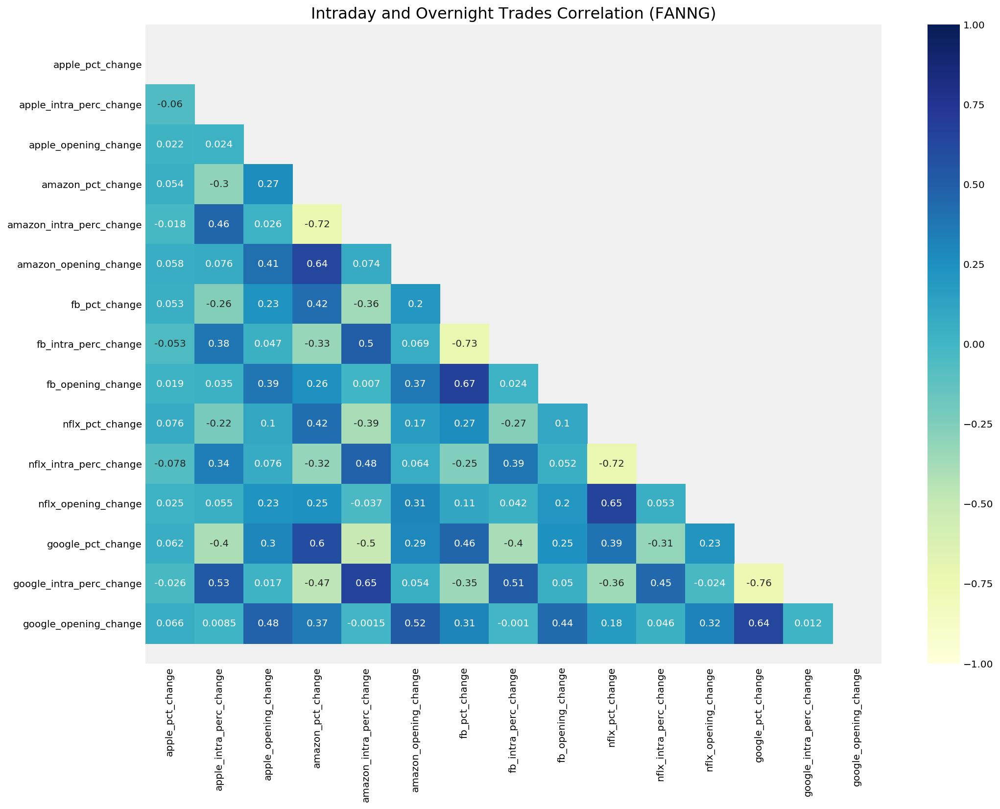

In [257]:
plt.figure(figsize = (15, 12))
plt.title('Intraday and Overnight Trades Correlation (FANNG)', fontsize = 16)
selected = ['apple_pct_change','apple_intra_perc_change','apple_opening_change',
            'amazon_pct_change','amazon_intra_perc_change','amazon_opening_change',
            'fb_pct_change', 'fb_intra_perc_change','fb_opening_change','nflx_pct_change',
            'nflx_intra_perc_change','nflx_opening_change','google_pct_change', 
            'google_intra_perc_change','google_opening_change']
mask = np.zeros(faang[selected].corr().shape, dtype=bool)
mask[np.triu_indices(len(mask))] = True
ax = sns.heatmap(faang[selected].corr(),mask=mask ,vmin = -1, vmax = 1, cmap="YlGnBu", center = 0, annot = True)
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.xticks(rotation='90')
plt.show()

In [258]:
other_big_list_corr=other_big_list.corr()
other_big_list_corr

,msft_close,msft_vol,msft_intra_perc_change,msft_intra_returns,msft_pct_change,msft_pct_returns,msft_previous_close,msft_opening_change,msft_opening_returns,msft_target,msft_intra_target,msft_open_target,apple_close,apple_vol,apple_intra_perc_change,apple_intra_returns,apple_pct_change,apple_pct_returns,apple_opening_change,apple_target,apple_intra_target,apple_open_target,tsla_close,tsla_vol,tsla_intra_perc_change,tsla_intra_returns,tsla_pct_change,tsla_pct_returns,tsla_previous_close,tsla_opening_change,tsla_opening_returns,tsla_target,tsla_intra_target,tsla_open_target
msft_close,1.000000,-0.360650,0.002454,-0.035571,0.032094,0.063309,0.999321,0.052913,0.088477,0.063309,-0.035571,0.088477,0.961282,-0.551025,-0.064767,-0.042053,0.013595,-0.006607,-0.051102,-0.006607,-0.042053,-0.013658,0.786986,0.528119,-0.031257,-0.037804,0.009184,0.001853,0.785208,-0.033732,-0.009925,0.001853,-0.037804,-0.009925
msft_vol,-0.360650,1.000000,0.044307,0.068232,-0.061479,-0.064976,-0.358651,-0.047997,-0.034709,-0.064976,0.068232,-0.034709,-0.407132,0.548843,0.090299,0.073027,-0.002388,0.001914,-0.029301,0.001914,0.073027,-0.013226,-0.407642,-0.149584,0.039804,0.036193,-0.042949,-0.050975,-0.402364,0.002960,-0.006667,-0.050975,0.036193,-0.006667
msft_intra_perc_change,0.002454,0.044307,1.000000,0.721713,-0.776210,-0.611060,0.025549,-0.043365,0.007625,-0.611060,0.721713,0.007625,0.005768,0.028448,0.505995,0.356564,-0.071609,-0.034053,-0.043969,-0.034053,0.356564,-0.010294,-0.006944,-0.028056,0.225416,0.196404,-0.223055,-0.169659,0.009761,-0.048799,-0.036805,-0.169659,0.196404,-0.036805
msft_intra_returns,-0.035571,0.068232,0.721713,1.000000,-0.551458,-0.668400,-0.021079,-0.018186,-0.003275,-0.668400,1.000000,-0.003275,-0.029068,0.066539,0.334722,0.299822,-0.012647,0.001855,-0.050592,0.001855,0.299822,-0.031844,-0.043378,-0.049365,0.154585,0.149202,-0.157925,-0.139857,-0.033257,-0.046259,-0.043968,-0.139857,0.149202,-0.043968
msft_pct_change,0.032094,-0.061479,-0.776210,-0.551458,1.000000,0.671437,0.001106,0.663400,0.361809,0.671437,-0.551458,0.361809,0.025266,-0.059375,-0.385190,-0.264628,0.091828,0.025589,0.334744,0.025589,-0.264628,0.220068,0.020088,0.026907,-0.165539,-0.142042,0.296672,0.212579,-0.003899,0.252899,0.201124,0.212579,-0.142042,0.201124
msft_pct_returns,0.063309,-0.064976,-0.611060,-0.668400,0.671437,1.000000,0.045482,0.339501,0.335287,1.000000,-0.668400,0.335287,0.049391,-0.055093,-0.298296,-0.280553,0.003644,0.000803,0.171684,0.000803,-0.280553,0.192942,0.049148,0.030108,-0.147815,-0.137653,0.209191,0.184084,0.036211,0.139458,0.169677,0.184084,-0.137653,0.169677
msft_previous_close,0.999321,-0.358651,0.025549,-0.021079,0.001106,0.045482,1.000000,0.031230,0.078517,0.045482,-0.021079,0.078517,0.960769,-0.549783,-0.051477,-0.033880,0.008648,-0.008240,-0.065263,-0.008240,-0.033880,-0.020448,0.787032,0.526966,-0.025725,-0.033575,-0.001705,-0.004350,0.786432,-0.044196,-0.015710,-0.004350,-0.033575,-0.015710
msft_opening_change,0.052913,-0.047997,-0.043365,-0.018186,0.663400,0.339501,0.031230,1.000000,0.581876,0.339501,-0.018186,0.581876,0.046024,-0.060838,-0.010199,0.003679,0.059138,-0.000382,0.477452,-0.000382,0.003679,0.335829,0.022944,0.008557,0.003635,0.007026,0.205975,0.135935,0.004627,0.341533,0.274458,0.135935,0.007026,0.274458
msft_opening_returns,0.088477,-0.034709,0.007625,-0.003275,0.361809,0.335287,0.078517,0.581876,1.000000,0.335287,-0.003275,1.000000,0.084709,-0.042759,0.007088,-0.004394,0.000684,-0.039881,0.278047,-0.039881,-0.004394,0.396626,0.058615,0.028493,-0.030784,-0.016913,0.163998,0.146498,0.049516,0.222907,0.318605,0.146498,-0.016913,0.318605
msft_target,0.063309,-0.064976,-0.611060,-0.668400,0.671437,1.000000,0.045482,0.339501,0.335287,1.000000,-0.668400,0.335287,0.049391,-0.055093,-0.298296,-0.280553,0.003644,0.000803,0.171684,0.000803,-0.280553,0.192942,0.049148,0.030108,-0.147815,-0.137653,0.209191,0.184084,0.036211,0.139458,0.169677,0.184084,-0.137653,0.169677


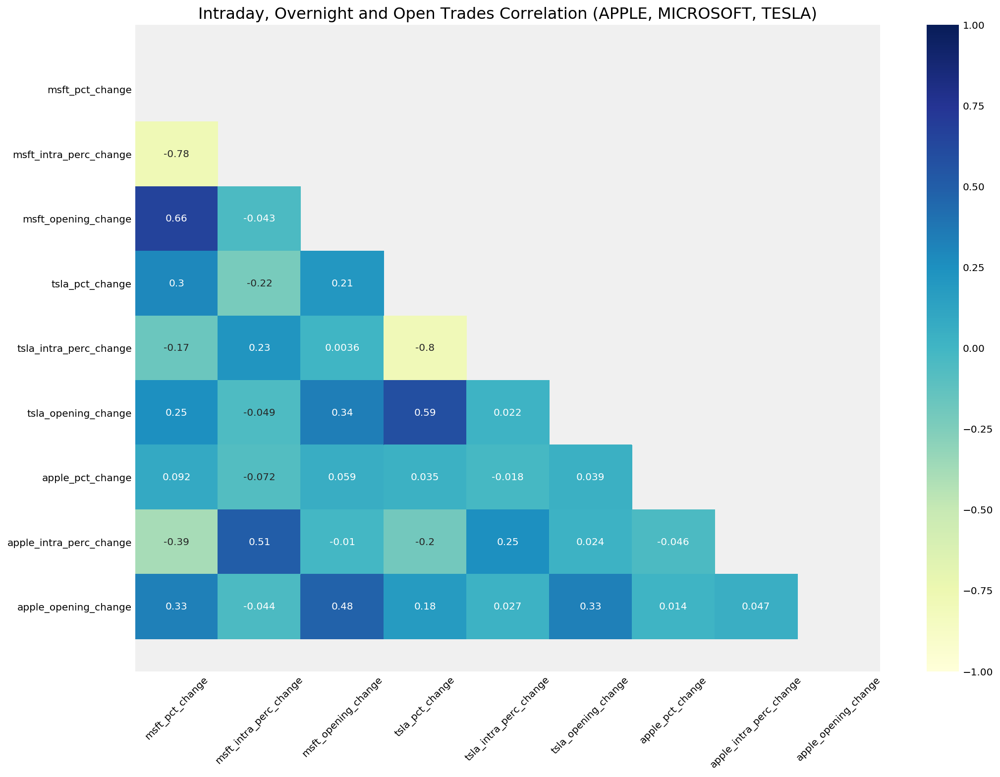

In [259]:
plt.figure(figsize = (15, 12))
plt.title('Intraday, Overnight and Open Trades Correlation (APPLE, MICROSOFT, TESLA)', fontsize = 16)
selected = ['msft_pct_change', 'msft_intra_perc_change','msft_opening_change', 
            'tsla_pct_change', 'tsla_intra_perc_change','tsla_opening_change',
            'apple_pct_change', 'apple_intra_perc_change','apple_opening_change']
mask = np.zeros(other_big_list[selected].corr().shape, dtype=bool)
mask[np.triu_indices(len(mask))] = True
ax = sns.heatmap(other_big_list[selected].corr(),mask=mask ,vmin = -1, vmax = 1, cmap="YlGnBu", center = 0, annot = True)
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.xticks(rotation='45')
plt.show()


### Visualize Correlation of the Strongly Negatively Correlated Stocks

In [260]:
neg_related_cols=['apple_pct_change','apple_intra_perc_change','amazon_pct_change','amazon_intra_perc_change', 'fb_pct_change', 'fb_intra_perc_change','nflx_pct_change','nflx_intra_perc_change','google_pct_change', 'google_intra_perc_change']

In [261]:
faang_neg_related=faang[neg_related_cols]

**Finding the Z Scores in Each Column**

In [262]:
faang_neg_related=(faang_neg_related-faang_neg_related.mean())/faang_neg_related.std()

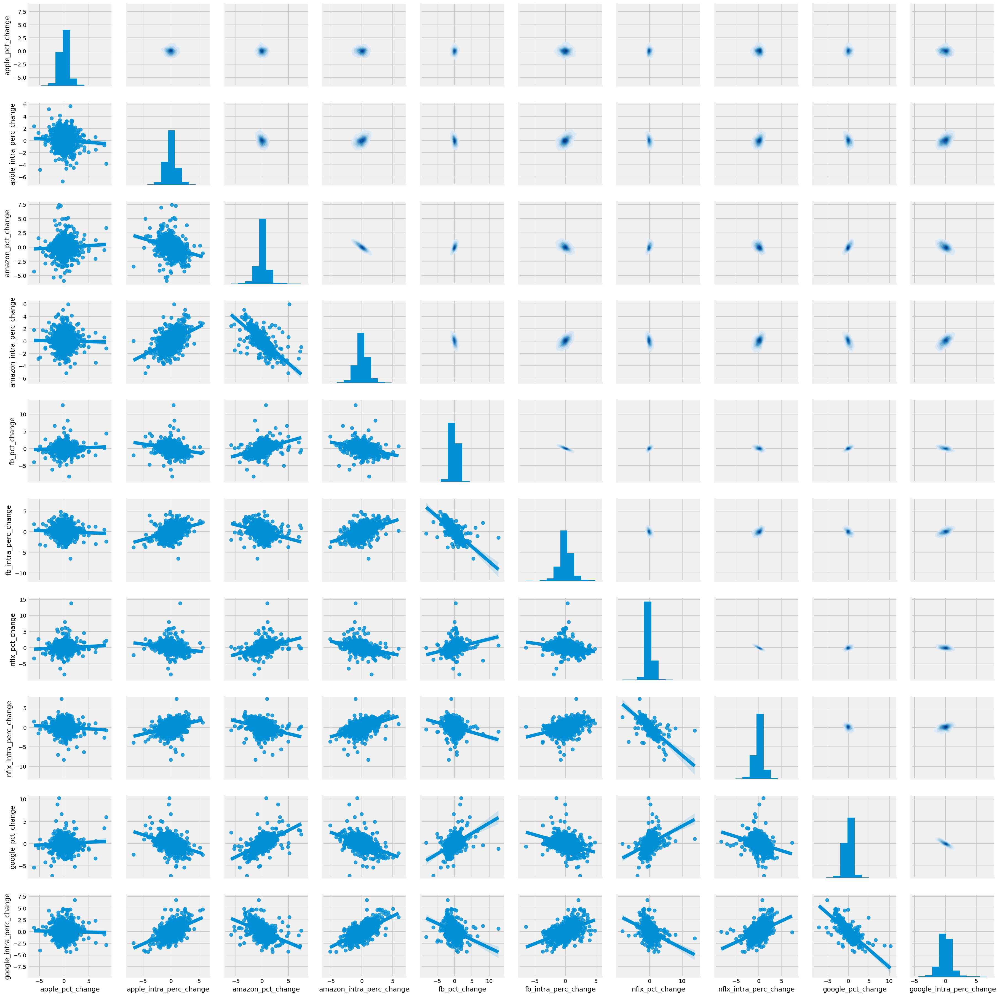

In [263]:
g=sns.PairGrid(faang_neg_related)
g=g.map_lower(sns.regplot)
g=g.map_upper(sns.kdeplot,cmap="Blues",shade=True,shade_lowest=False)
g=g.map_diag(plt.hist)

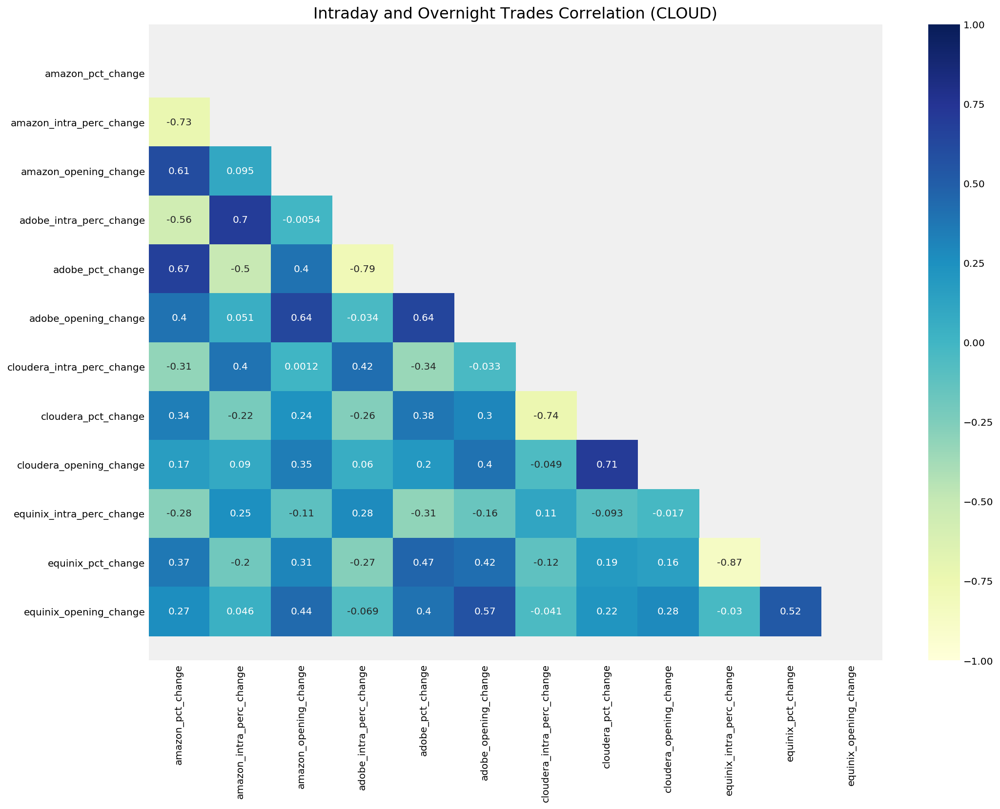

In [264]:
plt.figure(figsize = (15, 12))
plt.title('Intraday and Overnight Trades Correlation (CLOUD)', fontsize = 16)
selected = ['amazon_pct_change','amazon_intra_perc_change','amazon_opening_change', 
            'adobe_intra_perc_change' , 'adobe_pct_change','adobe_opening_change',
            'cloudera_intra_perc_change', 'cloudera_pct_change', 'cloudera_opening_change',
            'equinix_intra_perc_change','equinix_pct_change', 'equinix_opening_change']
mask = np.zeros(cloud[selected].corr().shape, dtype=bool)
mask[np.triu_indices(len(mask))] = True
ax = sns.heatmap(cloud[selected].corr(),mask=mask ,vmin = -1, vmax = 1, cmap="YlGnBu", center = 0, annot = True)
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.xticks(rotation='90')
plt.show()


**<h2>Insight :</h2>**
<br>
Our observations of the similar correlations and movements of FAANG and Cloud stocks informs us of the need to diversify into other technolody stocks that do not share this correlation.  

We also note a strong negative correlation between 'pct_change' and 'intra_perc_change' for all FAANG and Cloud stocks as well as Tesla, which is not found in other stocks such as Apple. This means that a **positive overnight trade (based on current close - previous close) coincides with a negative intraday trade (based on opening price - closing price).** This negative correlation insight informs the trader of a higher probability of a stock moving downwards if the stock gaps up at opening. Alternatively if a stock gaps lower, this informs the trader of a higher probability of a stock moving higher during intraday. 

A quick check on Tesla stock data over a 10 year period revealed this hypothesis to be true, whereby 70% of the time, a higher opening coincided with a low that minimally met previous day's closing price and vice versa. We find this to be interesting although it is not part of our overall analysis here. More analysis could be done separately.  



### Baseline Targets


In [265]:
apple_overnight_baseline=faang['apple_target'].value_counts(normalize=True)
apple_intraday_baseline=faang['apple_intra_target'].value_counts(normalize=True)
amazon_overnight_baseline=faang['amazon_target'].value_counts(normalize=True)
amazon_intraday_baseline=faang['amazon_intra_target'].value_counts(normalize=True)
fb_overnight_baseline=faang['fb_target'].value_counts(normalize=True)
fb_intraday_baseline=faang['fb_intra_target'].value_counts(normalize=True)
nflx_overnight_baseline=faang['nflx_target'].value_counts(normalize=True)
nflx_intraday_baseline=faang['nflx_intra_target'].value_counts(normalize=True)
google_overnight_baseline=faang['google_target'].value_counts(normalize=True)
google_intraday_baseline=faang['google_intra_target'].value_counts(normalize=True)
tsla_overnight_baseline=faang['tsla_target'].value_counts(normalize=True)
tsla_intraday_baseline=faang['tsla_intra_target'].value_counts(normalize=True)

In [266]:
faang['tsla_target'].value_counts(normalize=True)

 1    0.515443
-1    0.484557
Name: tsla_target, dtype: float64

In [267]:
faang['tsla_intra_target'].value_counts(normalize=True)

0    0.503291
1    0.496709
Name: tsla_intra_target, dtype: float64

In [268]:
faang['apple_target'].value_counts(normalize=True)

-1    0.523038
 1    0.476962
Name: apple_target, dtype: float64

In [269]:
faang['apple_intra_target'].value_counts(normalize=True)

-1    0.522532
 1    0.477468
Name: apple_intra_target, dtype: float64

In [270]:
faang['apple_open_target'].value_counts(normalize=True)

 1    0.558987
-1    0.441013
Name: apple_open_target, dtype: float64

In [271]:
faang['amazon_target'].value_counts(normalize=True)

 1    0.534177
-1    0.465823
Name: amazon_target, dtype: float64

In [272]:
faang['amazon_intra_target'].value_counts(normalize=True)

 1    0.501772
-1    0.498228
Name: amazon_intra_target, dtype: float64

In [273]:
faang['fb_target'].value_counts(normalize=True)

 1    0.524557
-1    0.475443
Name: fb_target, dtype: float64

In [274]:
faang['fb_intra_target'].value_counts(normalize=True)

-1    0.509873
 1    0.490127
Name: fb_intra_target, dtype: float64

In [275]:
faang['nflx_target'].value_counts(normalize=True)

 1    0.506329
-1    0.493671
Name: nflx_target, dtype: float64

In [276]:
faang['nflx_intra_target'].value_counts(normalize=True)

 1    0.506835
-1    0.493165
Name: nflx_intra_target, dtype: float64

In [277]:
faang['google_target'].value_counts(normalize=True)

 1    0.523038
-1    0.476962
Name: google_target, dtype: float64

In [278]:
faang['google_intra_target'].value_counts(normalize=True)

-1    0.505823
 1    0.494177
Name: google_intra_target, dtype: float64

Using a rudimentary approach of value counts, we observe a 50% probability of most stocks to go up on any given day. No imbalanced classes can be found in terms of frequent instances of postive or negative intraday returns. 

Hence there is no case of a stock frequently closing higher or lower, even though the stocks have been trending upwards. This is likely explained by the difference in magnitudes of increase or decrease in stock prices. We infer that long term investment rather than intraday trades could be a more profitable strategy as it could be difficult to time the upswings.


### Correlation Between Intraday and Overnight Trades (CLOUD)

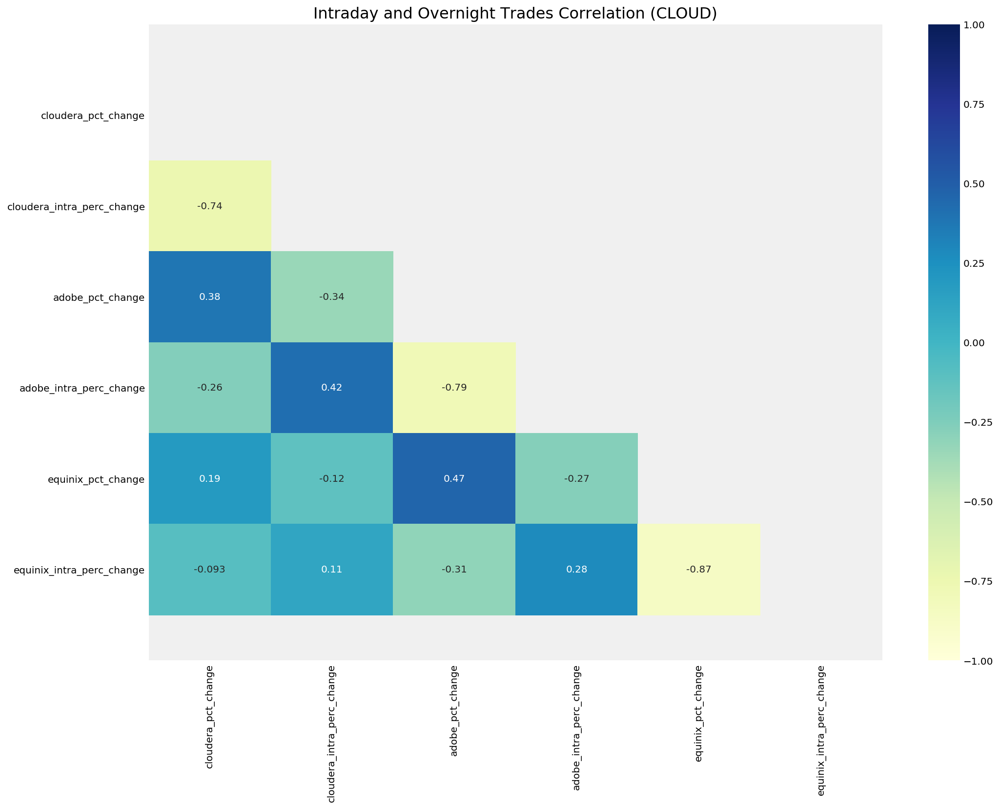

In [279]:
plt.figure(figsize = (15, 12))
plt.title('Intraday and Overnight Trades Correlation (CLOUD)', fontsize = 16)
selected = ['cloudera_pct_change', 'cloudera_intra_perc_change','adobe_pct_change', 'adobe_intra_perc_change', 'equinix_pct_change','equinix_intra_perc_change']
mask = np.zeros(cloud[selected].corr().shape, dtype=bool)
mask[np.triu_indices(len(mask))] = True
ax = sns.heatmap(cloud[selected].corr(),mask=mask ,vmin = -1, vmax = 1, cmap="YlGnBu", center = 0, annot = True)
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.xticks(rotation='90')
plt.show()

In [280]:
faang.head()

,date,fb_close,fb_vol,fb_intra_perc_change,fb_intra_returns,fb_pct_change,fb_pct_returns,fb_previous_close,fb_opening_change,fb_opening_returns,fb_target,fb_intra_target,fb_open_target,amazon_close,amazon_vol,amazon_intra_perc_change,amazon_intra_returns,amazon_pct_change,amazon_pct_returns,amazon_previous_close,amazon_opening_change,amazon_opening_returns,amazon_target,amazon_intra_target,amazon_open_target,apple_close,apple_vol,apple_intra_perc_change,apple_intra_returns,apple_pct_change,apple_pct_returns,apple_opening_change,apple_target,apple_intra_target,apple_open_target,nflx_close,nflx_vol,nflx_intra_perc_change,nflx_intra_returns,nflx_pct_change,nflx_pct_returns,nflx_previous_close,nflx_opening_change,nflx_opening_returns,nflx_target,nflx_intra_target,nflx_open_target,google_close,google_vol,google_intra_perc_change,google_intra_returns,google_pct_change,google_pct_returns,google_previous_close,google_opening_change,google_opening_returns,google_target,google_intra_target,google_open_target,tsla_close,tsla_vol,tsla_intra_perc_change,tsla_intra_returns,tsla_pct_change,tsla_pct_returns,tsla_previous_close,tsla_opening_change,tsla_opening_returns,tsla_target,tsla_intra_target,tsla_open_target
0,2012-05-21,34.03,168192700,6.843690,1,-0.109861,-1,38.23,-4.446770,-1,-1,1,-1,218.11,3579800,-1.906275,-1,0.019921,1,213.85,0.084171,1,1,-1,1,80.18,157250007,-5.002619,-1,0.007666,1,0.778672,1,-1,1,10.25,25143300,-2.705411,-1,0.026026,1,9.99,-0.100100,-1,1,-1,-1,305.91,6173800,-2.266573,-1,0.022837,1,299.08,0.016718,1,1,-1,1,28.770000,1475200,-4.314721,-1,0.043904,1,27.559999,0.072573,1,1,0,1
1,2012-05-22,31.00,101786600,4.937136,1,-0.089039,-1,34.03,-4.172789,-1,-1,1,-1,215.33,3733100,1.365031,1,-0.012746,-1,218.11,0.091697,1,-1,1,1,79.57,173417772,2.200098,1,-0.023801,-1,1.471689,-1,1,1,9.67,40014800,5.750487,1,-0.056585,-1,10.25,0.097561,1,-1,1,1,299.28,6126600,2.058448,1,-0.021673,-1,305.91,-0.111144,-1,-1,1,-1,30.799999,2366200,-2.325578,-1,0.070560,1,28.770000,4.622871,1,1,0,1
2,2012-05-23,32.00,73600000,-2.008288,-1,0.032258,1,31.00,1.193548,1,1,-1,1,217.28,4243800,-1.196963,-1,0.009056,1,215.33,-0.287930,-1,1,-1,-1,81.51,145594164,-2.348066,-1,0.009287,1,0.087973,1,-1,1,10.27,44100000,-6.535270,-1,0.062048,1,9.67,-0.310238,-1,1,-1,-1,303.59,6379900,-1.297965,-1,0.014401,1,299.28,0.140337,1,1,-1,1,31.020000,1220400,-1.505239,-1,0.007143,1,30.799999,-0.779221,-1,1,0,-1
3,2012-05-24,33.03,50237200,-0.242792,-1,0.032188,1,32.00,2.968750,1,1,-1,1,215.24,3141100,0.801917,1,-0.009389,-1,217.28,-0.138071,-1,-1,1,-1,80.76,123856147,1.835420,1,0.005353,1,0.932401,1,1,1,10.04,20742400,1.761252,1,-0.022395,-1,10.27,-0.486855,-1,-1,1,-1,300.70,3796600,0.902979,1,-0.009519,-1,303.59,-0.049409,-1,-1,1,-1,30.280001,1075600,3.103997,1,-0.023856,-1,31.020000,0.741457,1,-1,1,1
4,2012-05-25,31.91,37149800,3.009119,1,-0.033909,-1,33.03,-0.393582,-1,-1,1,-1,212.89,2171400,0.976790,1,-0.010918,-1,215.24,-0.116149,-1,-1,1,-1,80.33,81958125,0.409125,1,-0.017370,-1,-0.123824,-1,1,-1,10.03,33371100,0.594648,1,-0.000996,-1,10.04,0.498008,1,-1,1,1,294.66,7190500,1.576592,1,-0.020086,-1,300.70,-0.438976,-1,-1,1,-1,29.809999,757000,1.160481,1,-0.015522,-1,30.280001,-0.396304,-1,-1,1,-1


In [281]:
faang.tail(400)

,date,fb_close,fb_vol,fb_intra_perc_change,fb_intra_returns,fb_pct_change,fb_pct_returns,fb_previous_close,fb_opening_change,fb_opening_returns,fb_target,fb_intra_target,fb_open_target,amazon_close,amazon_vol,amazon_intra_perc_change,amazon_intra_returns,amazon_pct_change,amazon_pct_returns,amazon_previous_close,amazon_opening_change,amazon_opening_returns,amazon_target,amazon_intra_target,amazon_open_target,apple_close,apple_vol,apple_intra_perc_change,apple_intra_returns,apple_pct_change,apple_pct_returns,apple_opening_change,apple_target,apple_intra_target,apple_open_target,nflx_close,nflx_vol,nflx_intra_perc_change,nflx_intra_returns,nflx_pct_change,nflx_pct_returns,nflx_previous_close,nflx_opening_change,nflx_opening_returns,nflx_target,nflx_intra_target,nflx_open_target,google_close,google_vol,google_intra_perc_change,google_intra_returns,google_pct_change,google_pct_returns,google_previous_close,google_opening_change,google_opening_returns,google_target,google_intra_target,google_open_target,tsla_close,tsla_vol,tsla_intra_perc_change,tsla_intra_returns,tsla_pct_change,tsla_pct_returns,tsla_previous_close,tsla_opening_change,tsla_opening_returns,tsla_target,tsla_intra_target,tsla_open_target
1575,2018-08-23,172.90,18053600,0.109769,1,-0.004262,-1,173.64,-0.316747,-1,-1,1,-1,1902.90,3563000,0.223892,1,-0.001050,-1,1904.90,0.119166,1,-1,1,1,215.49,18505780,-0.391335,-1,-0.003100,-1,-0.186003,-1,-1,-1,339.17,11336400,2.568154,1,-0.015300,-1,344.44,1.065498,1,-1,1,1,1205.38,992600,0.145799,1,-0.001615,-1,1207.33,-0.015737,-1,-1,1,-1,320.100006,5147300,-0.300806,-1,-0.004788,-1,321.640015,-0.777266,-1,-1,0,-1
1576,2018-08-24,174.65,14631600,-0.546920,-1,0.010121,1,172.90,0.462695,1,1,-1,1,1905.39,2800900,0.267991,1,0.001309,1,1902.90,0.399916,1,1,1,1,216.16,18457720,0.203139,1,-0.008167,-1,0.515105,-1,1,1,358.82,14729100,-3.705202,-1,0.057936,1,339.17,2.013739,1,1,-1,1,1220.65,946600,-0.978640,-1,0.012668,1,1205.38,0.285387,1,1,-1,1,322.820007,3602600,-0.661052,-1,0.008497,1,320.100006,0.187443,1,1,0,1
1577,2018-08-27,177.46,17921900,-0.835275,-1,0.016089,1,174.65,0.767249,1,1,-1,1,1927.68,3569000,-0.662141,-1,0.011698,1,1905.39,0.504359,1,1,-1,1,217.94,20400770,-0.363804,-1,-0.008011,-1,0.457994,-1,-1,1,364.58,17427300,0.699986,1,0.016053,1,358.82,2.321498,1,1,1,1,1241.82,1156300,-1.158358,-1,0.017343,1,1220.65,0.569369,1,1,-1,1,319.269989,13079300,-0.399368,-1,-0.010997,-1,322.820007,-1.493094,-1,-1,0,-1
1578,2018-08-28,176.26,15910700,1.033127,1,-0.006762,-1,177.46,0.360645,1,-1,1,1,1932.82,3100700,0.253389,1,0.002666,1,1927.68,0.521352,1,1,1,1,219.70,22751390,-0.315054,-1,-0.014710,-1,0.490961,-1,-1,1,368.49,9222600,-0.343109,-1,0.010725,1,364.58,0.726864,1,1,-1,1,1231.15,1304000,0.816892,1,-0.008592,-1,1241.82,-0.042679,-1,-1,1,-1,311.859985,7649100,2.057102,1,-0.023209,-1,319.269989,-0.269360,-1,-1,1,-1
1579,2018-08-29,175.90,18494100,0.226886,1,-0.002042,-1,176.26,0.022694,1,-1,1,1,1998.10,6531800,-2.285700,-1,0.033774,1,1932.82,1.067352,1,1,-1,1,222.98,27074260,-1.285487,-1,-0.009110,-1,0.204825,-1,-1,1,368.04,8118700,-0.228758,-1,-0.001221,-1,368.49,-0.350077,-1,-1,-1,-1,1249.30,1298900,-0.957614,-1,0.014742,1,1231.15,0.511717,1,1,-1,1,305.010010,7447400,1.695291,1,-0.021965,-1,311.859985,-0.509843,-1,-1,1,-1
1580,2018-08-30,177.64,24216500,-0.989198,-1,0.009892,1,175.90,0.000000,-1,1,-1,-1,2002.38,7277300,-0.248320,-1,0.002142,1,1998.10,-0.034032,-1,1,-1,-1,225.03,48696960,-0.797312,-1,-0.011422,-1,0.121087,-1,-1,1,370.98,10981000,-1.638356,-1,0.007988,1,368.04,-0.825997,-1,1,-1,-1,1239.12,1331400,0.410696,1,-0.008149,-1,1249.30,-0.405827,-1,-1,1,-1,303.149994,7216700,-0.294443,-1,-0.006098,-1,305.010010,-0.901610,-1,-1,0,-1
1581,2018-08-31,175.73,18065200,0.801581,1,-0.010752,-1,177.64,-0.275839,-1,-1,1,-1,2012.71,4204400,-0.284504,-1,0.005159,1,2002.38,0.230725,1,1,-1,1,227.63,43177540,-0.494459,-1,-0.003197,-1,0.657690,-1,-1,1,367.68,7943400,0.803971,1,-0.008895,-1,370.98,-0.086258,-1,-1,1,-1,1218.19,1816400,1.35

**Google and Amazon (Overnight and Intraday) Are Postively Correlated**<br>
**Google and Facebook (Intraday) Are Postively Correlated**


This indicates that there could be a need for portfolio diversification into other stocks

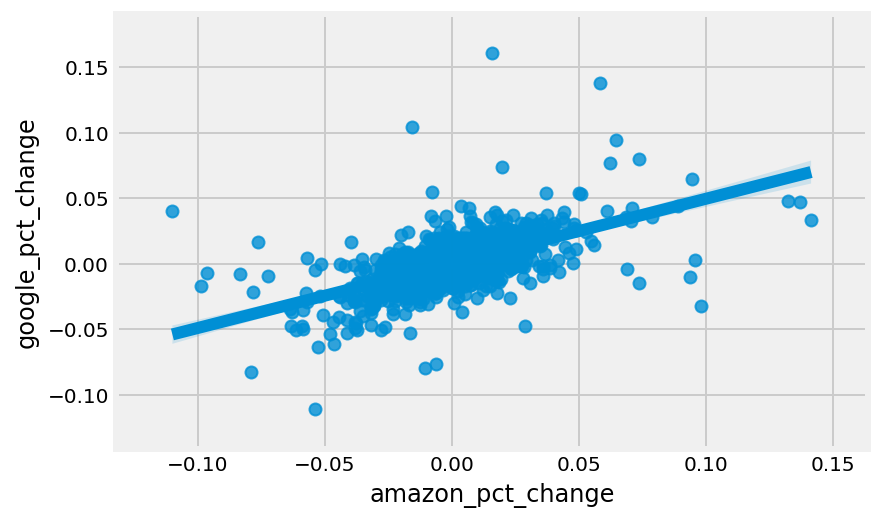

<Figure size 1080x864 with 0 Axes>

In [282]:
sns.regplot(faang['amazon_pct_change'], faang['google_pct_change']);
plt.figure(figsize=(15,12))
plt.show()

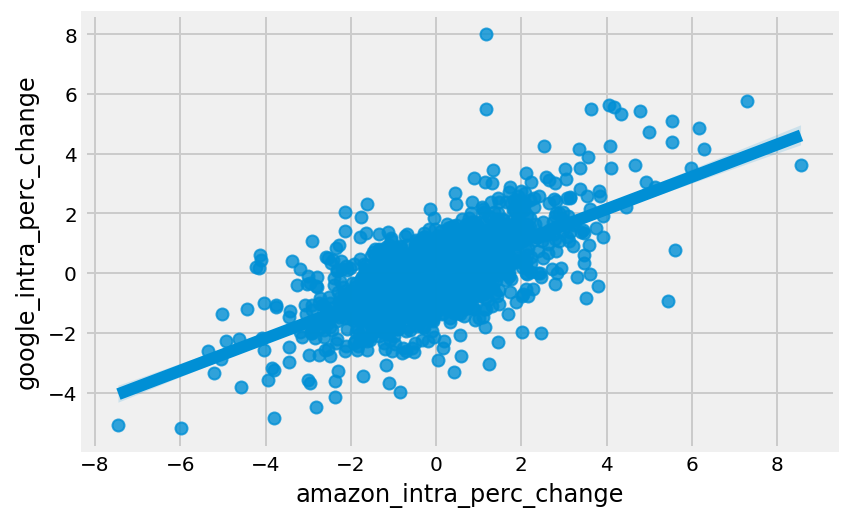

<Figure size 1080x864 with 0 Axes>

In [283]:
sns.regplot(faang['amazon_intra_perc_change'], faang['google_intra_perc_change']);
plt.figure(figsize=(15,12))
plt.show()

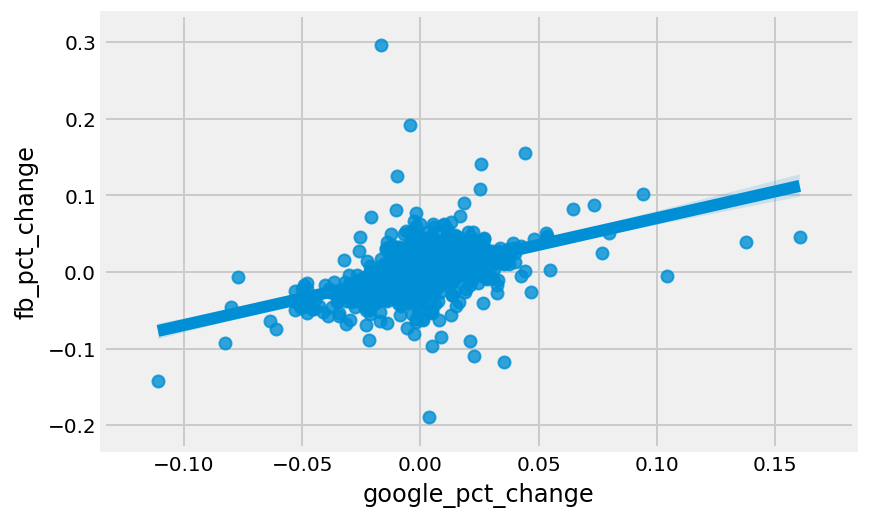

<Figure size 1080x864 with 0 Axes>

In [284]:
sns.regplot(faang['google_pct_change'], faang['fb_pct_change']);
plt.figure(figsize=(15,12))
plt.show()

<function matplotlib.pyplot.show(*args, **kw)>

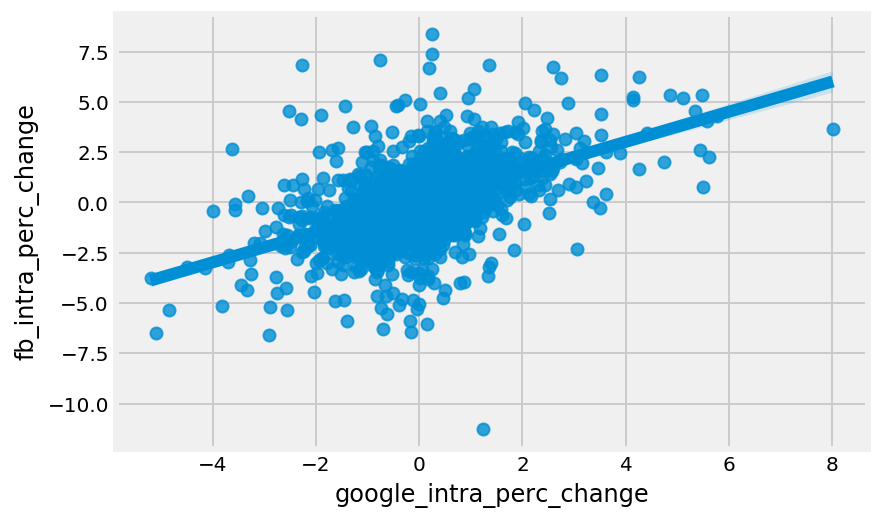

<Figure size 1080x864 with 0 Axes>

In [285]:
sns.regplot(faang['google_intra_perc_change'], faang['fb_intra_perc_change']);
plt.figure(figsize=(15,12))
plt.show

# SENTIMENT ANALYSIS


The Vadar scores have been preprocessed using grouby method to attain mean scores per day.



In [286]:
adobe_vadar=pd.read_csv('./datasets/headlines/adobe_headline_vadar.csv')
amazon_vadar=pd.read_csv('./datasets/headlines/amazon_headline_vadar.csv')
apple_vadar=pd.read_csv('./datasets/headlines/apple_headline_vadar.csv')
cloudera_vadar=pd.read_csv('./datasets/headlines/cloudera_headline_vadar.csv')
equinix_vadar=pd.read_csv('./datasets/headlines/equinix_headline_vadar.csv')
fb_vadar=pd.read_csv('./datasets/headlines/fb_headline_vadar.csv')
google_vadar=pd.read_csv('./datasets/headlines/google_headline_vadar.csv')
nflx_vadar=pd.read_csv('./datasets/headlines/nflx_headline_vadar.csv')
tsla_vadar=pd.read_csv('./datasets/headlines/tsla_headline_vadar.csv')

em_tweets3_vadar=pd.read_csv('./datasets/headlines/em_tweets3_vadar.csv')


### Elon Musk Twitter Feeds

In [287]:
em_tweets3_vadar.head(100)

,date,compound,neg,neu,pos
0,2010-06-04,0.4939,0.113,0.586,0.302
1,2011-12-01,0.8932,0.000,1.663,0.337
2,2011-12-03,0.5994,0.186,1.505,0.309
3,2011-12-04,0.7346,0.000,0.618,0.382
4,2011-12-21,1.6116,0.612,5.003,1.385
5,2011-12-22,0.4019,0.000,2.876,0.124
6,2011-12-24,0.7695,0.213,2.253,0.534
7,2011-12-26,1.6001,0.060,5.220,0.720
8,2011-12-27,0.7579,0.000,0.698,0.302
9,2011-12-28,0.7485,0.000,0.239,0.761


In [288]:
em_tweets3_vadar.rename(columns={'compound':'em_tweets3_compound', 
                             'neg':'em_tweets3_neg', 'neu':'em_tweets3_neu', 'pos':'em_tweets3_pos'}, inplace=True)

In [289]:

em_tweets3_vadar['em_tweets3_sentiment']=np.where(em_tweets3_vadar['em_tweets3_compound']>0,1,-1)



In [290]:
em_tweets3_vadar.drop(em_tweets3_vadar.columns.difference(['date','em_tweets3_sentiment','em_tweets3_compound']), 1, inplace=True)

In [291]:
em_tweets3_vadar.head(100)

,date,em_tweets3_compound,em_tweets3_sentiment
0,2010-06-04,0.4939,1
1,2011-12-01,0.8932,1
2,2011-12-03,0.5994,1
3,2011-12-04,0.7346,1
4,2011-12-21,1.6116,1
5,2011-12-22,0.4019,1
6,2011-12-24,0.7695,1
7,2011-12-26,1.6001,1
8,2011-12-27,0.7579,1
9,2011-12-28,0.7485,1


In [292]:
em_tweets3_vadar.to_csv('./datasets/headlines/em_tweets3_vadar2.csv')

**Tesla Headlines**

In [293]:
tsla_vadar.head(100)

,date,compound,neg,neu,pos
0,2014-11-13,0.0000,0.000,1.000,0.000
1,2014-11-14,0.0000,0.000,1.000,0.000
2,2014-11-19,-0.4404,0.225,0.775,0.000
3,2014-11-24,0.0000,0.000,1.000,0.000
4,2014-11-28,0.0000,0.000,2.000,0.000
5,2014-12-01,-0.4588,0.300,0.700,0.000
6,2014-12-02,0.4404,0.000,0.633,0.367
7,2014-12-03,-0.2732,0.231,0.769,0.000
8,2014-12-08,0.0000,0.000,1.000,0.000
9,2014-12-09,-0.3818,0.191,1.809,0.000


In [294]:
tsla_vadar.rename(columns={'compound':'tsla_compound', 
                             'neg':'tsla_neg', 'neu':'tsla_neu', 'pos':'tsla_pos'}, inplace=True)

In [295]:

tsla_vadar['tsla_sentiment']=np.where(tsla_vadar['tsla_compound']>0,1,-1)



In [296]:
tsla_vadar.drop(tsla_vadar.columns.difference(['date','tsla_sentiment','tsla_compound']), 1, inplace=True)

In [297]:
tsla_vadar.head()

,date,tsla_compound,tsla_sentiment
0,2014-11-13,0.0000,-1
1,2014-11-14,0.0000,-1
2,2014-11-19,-0.4404,-1
3,2014-11-24,0.0000,-1
4,2014-11-28,0.0000,-1


In [298]:
tsla.shape

(2467, 13)

In [299]:
tsla_vadar.to_csv('./datasets/headlines/tsla_vadar2.csv')

**Amazon Headlines**

In [300]:
amazon_vadar.head()

,date,compound,neg,neu,pos
0,2014-11-12,-0.3818,0.331,0.538,0.131
1,2014-11-13,-0.1280,0.222,1.606,0.172
2,2014-11-14,0.3861,0.313,0.857,0.830
3,2014-11-18,0.0000,0.000,1.000,0.000
4,2014-11-19,0.4019,0.000,0.690,0.310


In [301]:
amazon_vadar.rename(columns={'compound':'amazon_compound', 
                             'neg':'amazon_neg', 'neu':'amazon_neu', 'pos':'amazon_pos'}, inplace=True)

In [302]:
#amazon_vadar['amazon_sentiment']=(amazon_vadar['amazon_compound']>0).astype(int)
amazon_vadar['amazon_sentiment']=np.where(amazon_vadar['amazon_compound']>0,1,-1)

In [303]:
amazon_vadar.drop(amazon_vadar.columns.difference(['date','amazon_sentiment','amazon_compound']), 1, inplace=True)

In [304]:
amazon_vadar.head(100)

,date,amazon_compound,amazon_sentiment
0,2014-11-12,-0.3818,-1
1,2014-11-13,-0.1280,-1
2,2014-11-14,0.3861,1
3,2014-11-18,0.0000,-1
4,2014-11-19,0.4019,1
5,2014-11-20,0.1779,1
6,2014-11-21,0.1779,1
7,2014-11-24,0.0000,-1
8,2014-11-26,-0.0140,-1
9,2014-11-27,0.1779,1


In [305]:
amazon_vadar.shape

(1378, 3)

**Facebook Headlines**

In [306]:
fb_vadar.head()

,date,compound,neg,neu,pos
0,2014-11-13,0.0000,0.000,1.000,0.000
1,2014-11-17,0.1628,0.216,1.355,0.429
2,2014-11-18,0.4588,0.000,0.571,0.429
3,2014-11-25,0.0000,0.000,1.000,0.000
4,2014-11-26,0.4588,0.000,0.625,0.375


In [307]:
fb_vadar.rename(columns={'compound':'fb_compound', 
                             'neg':'fb_neg', 'neu':'fb_neu', 'pos':'fb_pos'}, inplace=True)

In [308]:
fb_vadar['fb_sentiment']=(fb_vadar['fb_compound']>0).astype(int)

In [309]:
#fb_vadar.drop(fb_vadar.columns.difference(['date','fb_sentiment','fb_compound']), 1, inplace=True)
fb_vadar['fb_sentiment']=np.where(fb_vadar['fb_compound']>0,1,-1)

In [310]:
fb_vadar.head()

,date,fb_compound,fb_neg,fb_neu,fb_pos,fb_sentiment
0,2014-11-13,0.0000,0.000,1.000,0.000,-1
1,2014-11-17,0.1628,0.216,1.355,0.429,1
2,2014-11-18,0.4588,0.000,0.571,0.429,1
3,2014-11-25,0.0000,0.000,1.000,0.000,-1
4,2014-11-26,0.4588,0.000,0.625,0.375,1


In [311]:
fb_vadar.shape

(1243, 6)

**Google Headlines**

In [312]:
google_vadar.head()

,date,compound,neg,neu,pos
0,2014-11-12,0.0000,0.333,1.417,0.250
1,2014-11-14,0.4588,0.000,0.700,0.300
2,2014-11-19,0.3400,0.000,1.745,0.255
3,2014-11-21,0.2500,0.000,0.800,0.200
4,2014-11-25,0.0000,0.000,2.000,0.000


In [313]:
google_vadar.rename(columns={'compound':'google_compound', 
                             'neg':'google_neg', 'neu':'google_neu', 'pos':'google_pos'}, inplace=True)

In [314]:
#google_vadar['google_sentiment']=(google_vadar['google_compound']>0).astype(int)
google_vadar['google_sentiment']=np.where(google_vadar['google_compound']>0,1,-1)

In [315]:
google_vadar.drop(google_vadar.columns.difference(['date','google_sentiment', 'google_compound']), 1, inplace=True)

In [316]:
google_vadar.tail(1000)

,date,google_compound,google_sentiment
282,2016-07-01,0.0000,-1
283,2016-07-03,0.0000,-1
284,2016-07-05,0.0000,-1
285,2016-07-06,0.4019,1
286,2016-07-07,1.0957,1
287,2016-07-08,0.8149,1
288,2016-07-11,0.8702,1
289,2016-07-12,0.7398,1
290,2016-07-13,0.0000,-1
291,2016-07-14,0.0772,1


In [317]:
google_vadar.shape

(1282, 3)

### Creating a Dataframe of Vadar Sentiment Analysis (Google, Amazon, Facebook, Tesla)

In [318]:
faang_vadar1=pd.merge(google_vadar,amazon_vadar, how='inner', on='date')

In [319]:
faang_vadar2=pd.merge(fb_vadar,tsla_vadar, how='inner', on='date')

In [320]:
faang_vadar3=pd.merge(faang_vadar1,faang_vadar2, how='inner', on='date')

In [321]:
faang_vadar= pd.merge(faang_vadar3,em_tweets3_vadar, how='inner', on='date')

In [322]:
faang_vadar.dtypes

date                     object
google_compound         float64
google_sentiment          int64
amazon_compound         float64
amazon_sentiment          int64
fb_compound             float64
fb_neg                  float64
fb_neu                  float64
fb_pos                  float64
fb_sentiment              int64
tsla_compound           float64
tsla_sentiment            int64
em_tweets3_compound     float64
em_tweets3_sentiment      int64
dtype: object

In [323]:
faang_vadar['date'] = pd.to_datetime(faang_vadar['date'])

In [324]:
faang_vadar.head()

,date,google_compound,google_sentiment,amazon_compound,amazon_sentiment,fb_compound,fb_neg,fb_neu,fb_pos,fb_sentiment,tsla_compound,tsla_sentiment,em_tweets3_compound,em_tweets3_sentiment
0,2015-01-15,0.6486,1,-0.1027,-1,0.0000,0.000,1.000,0.000,-1,0.4019,1,1.1457,1
1,2015-03-24,0.0000,-1,-0.1520,-1,0.2960,0.000,0.820,0.180,1,0.7845,1,-0.3021,-1
2,2015-04-23,-0.4739,-1,0.7697,1,0.5849,0.125,0.486,0.389,1,0.5991,1,0.4215,1
3,2015-05-06,0.0000,-1,0.0000,-1,0.4588,0.000,0.786,0.214,1,0.4697,1,0.2023,1
4,2015-07-17,-0.4165,-1,0.4588,1,0.7096,0.000,0.537,0.463,1,0.0000,-1,0.0000,-1


In [325]:
faang_vadar.to_csv('./datasets/preprocessed/faang_vadar.csv')

**DJI Analysis**

In [326]:
dji.tail()

,Date,Open,High,Low,Close,Adj Close,Volume
2512,2020-03-23,19028.359375,19121.009766,18213.650391,18591.929688,18591.929688,787970000
2513,2020-03-24,19722.189453,20737.699219,19649.250000,20704.910156,20704.910156,799340000
2514,2020-03-25,21050.339844,22019.929688,20538.339844,21200.550781,21200.550781,796320000
2515,2020-03-26,21468.380859,22595.060547,21427.099609,22552.169922,22552.169922,705180000
2516,2020-03-27,21898.470703,22327.570313,21469.269531,21636.779297,21636.779297,588830000


In [327]:
dji.dtypes


Date          object
Open         float64
High         float64
Low          float64
Close        float64
Adj Close    float64
Volume         int64
dtype: object

In [328]:
dji.isnull().sum()

Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64

In [329]:
dji.columns=[x.lower()for x in dji.columns]


In [330]:
dji['date']=pd.to_datetime(dji['date'])

In [331]:
dji.rename(columns={'open': 'dji_open','close': 'dji_close' ,'volume':'dji_vol', 'high': 'dji_high', 
                    'low': 'dji_low'}, inplace=True)

In [332]:
dji['dji_perc_change']=((dji['dji_close'] - dji['dji_open'])/dji['dji_open'])*100

In [333]:
dji['dji_return']=np.where(dji['dji_perc_change']>0, 1, -1)


In [334]:
dji.loc[:,'dji_previous_day_return']=dji['dji_return'].shift(1)

In [335]:
dji.loc[:,'dji_previous_perc_change']=dji['dji_perc_change'].shift(1)

In [336]:
del dji['adj close']

In [337]:
dji = dji.iloc[1:]

In [338]:
dji.head()

,date,dji_open,dji_high,dji_low,dji_close,dji_vol,dji_perc_change,dji_return,dji_previous_day_return,dji_previous_perc_change
1,2010-03-31,10907.339844,10907.419922,10832.830078,10856.629883,197060000,-0.464916,-1,1.0,0.113817
2,2010-04-01,10857.309570,10956.389648,10857.309570,10927.070313,159520000,0.642523,1,-1.0,-0.464916
3,2010-04-05,10927.450195,10988.059570,10923.969727,10973.549805,139480000,0.421870,1,1.0,0.642523
4,2010-04-06,10972.490234,10987.379883,10927.519531,10969.990234,159960000,-0.022784,-1,1.0,0.421870
5,2010-04-07,10961.950195,10962.660156,10845.450195,10897.519531,187000000,-0.587766,-1,-1.0,-0.022784


In [339]:
dji.shape

(2516, 10)

In [340]:
dji.dtypes

date                        datetime64[ns]
dji_open                           float64
dji_high                           float64
dji_low                            float64
dji_close                          float64
dji_vol                              int64
dji_perc_change                    float64
dji_return                           int64
dji_previous_day_return            float64
dji_previous_perc_change           float64
dtype: object

In [341]:

#Saving the file for future analysis
dji.to_csv('./datasets/preprocessed/dji2.csv')

**DAX Analysis**

In [342]:
dax.tail()

,Date,Open,High,Low,Close,Adj Close,Volume
2532,2020-04-08,10301.55957,10340.79004,10198.21973,10332.88965,10332.88965,102430700.0
2533,2020-04-09,10490.65039,10649.79004,10311.70020,10564.74023,10564.74023,134477100.0
2534,2020-04-14,10733.96973,10820.16992,10658.95996,10696.55957,10696.55957,106043700.0
2535,2020-04-15,10678.19043,10678.19043,10243.11035,10279.75977,10279.75977,133088500.0
2536,2020-04-16,10420.25977,10438.37012,10236.24023,10301.54004,10301.54004,106131500.0


In [343]:
dax.dtypes

Date          object
Open         float64
High         float64
Low          float64
Close        float64
Adj Close    float64
Volume       float64
dtype: object

In [344]:
dax.columns=[x.lower()for x in dax.columns]

In [345]:
dax.isnull().sum()

date         0
open         5
high         5
low          5
close        5
adj close    5
volume       5
dtype: int64

In [346]:
dax.columns=[x.lower()for x in dax.columns]

In [347]:
dax.rename(columns={'open': 'dax_open','close':'dax_close','volume':'dax_vol','high': 'dax_high','low': 'dax_low'}, inplace=True)

In [348]:
dax['date']=pd.to_datetime(dax['date'])

In [349]:
dax.dropna(inplace=True)

In [350]:
dax['dax_perc_change']=((dax['dax_close'] - dax['dax_open'])/dax['dax_open'])*100

In [351]:
dax['dax_return']=np.where(dax['dax_perc_change']>0, 1, -1)


In [352]:
del dax['adj close']

In [353]:
#dax=dax.set_index('date')

In [354]:
dax.shape

(2532, 8)

In [355]:
# dax_to_float=['dax_vol']
# dax[dax_to_fl] = dax[dax_to_float].astype(float)
dax['dax_vol'] = dax['dax_vol'].astype(int)

In [356]:
dax.dtypes

date               datetime64[ns]
dax_open                  float64
dax_high                  float64
dax_low                   float64
dax_close                 float64
dax_vol                     int64
dax_perc_change           float64
dax_return                  int64
dtype: object

In [357]:
dax.head()

,date,dax_open,dax_high,dax_low,dax_close,dax_vol,dax_perc_change,dax_return
0,2010-04-19,6158.600098,6190.859863,6140.379883,6162.439941,133583500,0.062349,1
1,2010-04-20,6193.500000,6267.540039,6172.569824,6264.229980,133489200,1.142003,1
2,2010-04-21,6280.540039,6281.379883,6229.180176,6230.379883,149364800,-0.798660,-1
3,2010-04-22,6229.229980,6286.359863,6141.069824,6168.720215,174052000,-0.971384,-1
4,2010-04-23,6192.620117,6287.540039,6170.390137,6259.529785,124506000,1.080474,1


In [358]:
#Saving the file for future analysis
dax.to_csv('./datasets/preprocessed/dax2.csv')

**CAC Analysis**

In [359]:
cac.columns=[x.lower()for x in cac.columns]

In [360]:
cac['date']=pd.to_datetime(cac['date'])

In [361]:
cac.columns=[x.lower()for x in cac.columns]

In [362]:
cac.rename(columns={'open':'cac_open','close':'cac_close','volume':'cac_vol', 'high': 'cac_high', 
                    'low': 'cac_low'}, inplace=True)

In [363]:
cac['cac_perc_change']=((cac['cac_close'] - cac['cac_open'])/cac['cac_open'])*100

In [364]:
cac['cac_return']=np.where(cac['cac_perc_change']>0, 1, -1)


In [365]:
del cac['adj close']

In [366]:
#cac=cac.set_index('date')

In [367]:
cac.tail()

,date,cac_open,cac_high,cac_low,cac_close,cac_vol,cac_perc_change,cac_return
2552,2020-04-08,4397.359863,4442.750000,4333.089844,4442.750000,96256500.0,1.032213,1
2553,2020-04-09,4512.299805,4543.689941,4409.040039,4506.850098,126589000.0,-0.120774,-1
2554,2020-04-14,4553.549805,4577.839844,4497.560059,4523.910156,104764600.0,-0.650913,-1
2555,2020-04-15,4511.870117,4525.500000,4335.589844,4353.720215,119358000.0,-3.505196,-1
2556,2020-04-16,4402.379883,4418.649902,4318.899902,4350.160156,0.0,-1.186170,-1


In [368]:
cac.dtypes

date               datetime64[ns]
cac_open                  float64
cac_high                  float64
cac_low                   float64
cac_close                 float64
cac_vol                   float64
cac_perc_change           float64
cac_return                  int64
dtype: object

In [369]:
cac.dropna(inplace=True)

In [370]:
cac.shape

(2555, 8)

In [371]:
cac['cac_vol'] = cac['cac_vol'].astype(int)

In [372]:
#Saving the file for future analysis
cac.to_csv('./datasets/preprocessed/cac2.csv')

### Combining DJI, DAX, CAC, FTSE into Dataframe

In [373]:
indexes1=pd.merge(dji,cac, how='inner', on='date')

In [374]:
indexes=pd.merge(indexes1,dax, how='inner', on='date')

In [375]:
indexes.tail(100)

,date,dji_open,dji_high,dji_low,dji_close,dji_vol,dji_perc_change,dji_return,dji_previous_day_return,dji_previous_perc_change,cac_open,cac_high,cac_low,cac_close,cac_vol,cac_perc_change,cac_return,dax_open,dax_high,dax_low,dax_close,dax_vol,dax_perc_change,dax_return
2356,2019-10-30,27110.710938,27204.359375,26999.640625,27186.689453,231750000,0.280253,1,1.0,0.038397,5749.689941,5765.870117,5720.270020,5765.870117,90959100,0.281410,1,12929.419920,12944.259770,12830.330080,12910.230470,100397400,-0.148417,-1
2357,2019-10-31,27188.369141,27188.369141,26918.289063,27046.230469,270910000,-0.522792,-1,1.0,0.280253,5770.259766,5778.240234,5718.629883,5729.859863,112062300,-0.700140,-1,12937.589840,12953.339840,12795.089840,12866.790040,100660900,-0.547241,-1
2358,2019-11-01,27142.949219,27347.429688,27142.949219,27347.359375,270870000,0.753087,1,-1.0,-0.522792,5749.479980,5778.290039,5739.700195,5761.890137,65867300,0.215848,1,12912.089840,12992.070310,12896.719730,12961.049810,65905400,0.379179,1
2359,2019-11-04,27402.060547,27517.580078,27402.060547,27462.109375,273030000,0.219140,1,1.0,0.753087,5788.359863,5833.689941,5784.850098,5824.299805,86434000,0.620900,1,13022.950200,13171.169920,13019.179690,13136.280270,84782400,0.870233,1
2360,2019-11-05,27500.230469,27560.359375,27453.550781,27492.630859,286350000,-0.027635,-1,1.0,0.219140,5825.600098,5850.009766,5818.939941,5846.890137,78408500,0.365457,1,13134.330080,13166.080080,13112.650390,13148.500000,83190400,0.107885,1
2361,2019-11-06,27502.740234,27526.050781,27407.810547,27492.560547,237910000,-0.037013,-1,-1.0,-0.027635,5847.609863,5876.270020,5838.399902,5866.740234,86948200,0.327149,1,13150.940430,13187.660160,13110.910160,13179.889650,80045600,0.220130,1
2362,2019-11-07,27590.160156,27774.669922,27590.160156,27674.800781,259020000,0.306778,1,-1.0,-0.037013,5888.839844,5894.870117,5871.180176,5890.990234,105688900,0.036516,1,13258.259770,13300.759770,13227.370120,13289.459960,117100600,0.235326,1
2363,2019-11-08,27686.199219,27694.949219,27578.970703,27681.240234,221440000,-0.017911,-1,1.0,0.306778,5867.419922,5889.700195,5861.609863,5889.700195,94387100,0.379729,1,13248.620120,13278.179690,13195.830080,13228.559570,95599200,-0.151416,-1
2364,2019-11-11,27580.660156,27714.390625,27517.669922,27691.490234,202350000,0.401840,1,-1.0,-0.017911,5873.740234,5906.330078,5871.709961,5893.819824,60606400,0.341854,1,13170.179690,13225.620120,13144.089840,13198.370120,72597200,0.214047,1
2365,2019-11-12,27701.589844,27770.859375,27635.320313,27691.490234,213670000,-0.036459,-1,1.0,0.401840,5904.270020,5931.189941,5897.299805,5919.750000,72093200,0.262183,1,13243.530270,13308.259770,13214.660160,13283.509770,82741400,0.301879,1


In [376]:
indexes.shape

(2456, 24)

In [377]:
indexes.dtypes

date                        datetime64[ns]
dji_open                           float64
dji_high                           float64
dji_low                            float64
dji_close                          float64
dji_vol                              int64
dji_perc_change                    float64
dji_return                           int64
dji_previous_day_return            float64
dji_previous_perc_change           float64
cac_open                           float64
cac_high                           float64
cac_low                            float64
cac_close                          float64
cac_vol                              int64
cac_perc_change                    float64
cac_return                           int64
dax_open                           float64
dax_high                           float64
dax_low                            float64
dax_close                          float64
dax_vol                              int64
dax_perc_change                    float64
dax_return 

In [378]:
indexes.tail()

,date,dji_open,dji_high,dji_low,dji_close,dji_vol,dji_perc_change,dji_return,dji_previous_day_return,dji_previous_perc_change,cac_open,cac_high,cac_low,cac_close,cac_vol,cac_perc_change,cac_return,dax_open,dax_high,dax_low,dax_close,dax_vol,dax_perc_change,dax_return
2451,2020-03-23,19028.359375,19121.009766,18213.650391,18591.929688,787970000,-2.293575,-1,-1.0,-5.328405,3869.010010,4097.819824,3851.169922,3914.310059,195845200,1.170843,1,8536.330078,9071.139648,8480.280273,8741.150391,197208600,2.399395,1
2452,2020-03-24,19722.189453,20737.699219,19649.250000,20704.910156,799340000,4.982817,1,-1.0,-2.293575,4087.610107,4242.700195,4038.060059,4242.700195,185439800,3.794151,1,9242.059570,9700.570313,9102.169922,9700.570313,203840700,4.961132,1
2453,2020-03-25,21050.339844,22019.929688,20538.339844,21200.550781,796320000,0.713580,1,1.0,4.982817,4339.709961,4453.009766,4221.319824,4432.299805,176942500,2.133549,1,9987.370117,10137.620120,9460.910156,9874.259766,204692500,-1.132534,-1
2454,2020-03-26,21468.380859,22595.060547,21427.099609,22552.169922,705180000,5.048304,1,1.0,0.713580,4332.790039,4543.580078,4296.060059,4543.580078,150657300,4.864995,1,9621.240234,10000.959960,9526.169922,10000.959960,160450300,3.946682,1
2455,2020-03-27,21898.470703,22327.570313,21469.269531,21636.779297,588830000,-1.195021,-1,1.0,5.048304,4433.950195,4471.370117,4288.660156,4351.490234,144021100,-1.859740,-1,9793.500000,9886.179688,9541.830078,9632.519531,156138300,-1.643748,-1


In [379]:
indexes.isnull().sum()

date                        0
dji_open                    0
dji_high                    0
dji_low                     0
dji_close                   0
dji_vol                     0
dji_perc_change             0
dji_return                  0
dji_previous_day_return     0
dji_previous_perc_change    0
cac_open                    0
cac_high                    0
cac_low                     0
cac_close                   0
cac_vol                     0
cac_perc_change             0
cac_return                  0
dax_open                    0
dax_high                    0
dax_low                     0
dax_close                   0
dax_vol                     0
dax_perc_change             0
dax_return                  0
dtype: int64

### **Combining with Faang**

In [380]:
faang.tail(200)

,date,fb_close,fb_vol,fb_intra_perc_change,fb_intra_returns,fb_pct_change,fb_pct_returns,fb_previous_close,fb_opening_change,fb_opening_returns,fb_target,fb_intra_target,fb_open_target,amazon_close,amazon_vol,amazon_intra_perc_change,amazon_intra_returns,amazon_pct_change,amazon_pct_returns,amazon_previous_close,amazon_opening_change,amazon_opening_returns,amazon_target,amazon_intra_target,amazon_open_target,apple_close,apple_vol,apple_intra_perc_change,apple_intra_returns,apple_pct_change,apple_pct_returns,apple_opening_change,apple_target,apple_intra_target,apple_open_target,nflx_close,nflx_vol,nflx_intra_perc_change,nflx_intra_returns,nflx_pct_change,nflx_pct_returns,nflx_previous_close,nflx_opening_change,nflx_opening_returns,nflx_target,nflx_intra_target,nflx_open_target,google_close,google_vol,google_intra_perc_change,google_intra_returns,google_pct_change,google_pct_returns,google_previous_close,google_opening_change,google_opening_returns,google_target,google_intra_target,google_open_target,tsla_close,tsla_vol,tsla_intra_perc_change,tsla_intra_returns,tsla_pct_change,tsla_pct_returns,tsla_previous_close,tsla_opening_change,tsla_opening_returns,tsla_target,tsla_intra_target,tsla_open_target
1775,2019-06-12,175.04,17681500,1.872407,1,-0.017181,-1,178.10,0.157215,1,-1,1,1,1855.32,2674500,-0.072277,-1,-0.004496,-1,1863.70,-0.521543,-1,-1,-1,-1,194.19,18253190,-0.123743,-1,0.000206,1,-0.441456,1,-1,-1,345.56,4584700,1.779319,1,-0.016255,-1,351.27,0.156575,1,-1,1,1,1077.03,1061000,0.089981,1,-0.001567,-1,1078.72,-0.066746,-1,-1,1,-1,209.259995,15186200,6.140391,1,-0.036112,-1,217.100006,2.694607,1,-1,1,1
1776,2019-06-13,177.47,12253600,-1.105224,-1,0.013883,1,175.04,0.279936,1,1,-1,1,1870.30,2795800,-0.191780,-1,0.008074,1,1855.32,0.614449,1,1,-1,1,194.15,21674630,0.282486,1,0.007316,1,0.262629,1,1,1,343.43,6209300,1.094375,1,-0.006164,-1,345.56,0.483274,1,-1,1,1,1088.77,1057700,-0.473404,-1,0.010900,1,1077.03,0.613725,1,1,-1,1,213.910004,8168300,-1.677916,-1,0.022221,1,209.259995,0.535224,1,1,0,1
1777,2019-06-14,181.33,16773700,-0.454268,-1,0.021750,1,177.47,1.712966,1,1,-1,1,1869.67,2851200,-0.304185,-1,-0.000337,-1,1870.30,-0.336844,-1,-1,-1,-1,192.74,18761470,-0.621248,-1,-0.005931,-1,-1.339171,-1,-1,-1,339.73,5019000,0.556157,1,-0.010774,-1,343.43,-0.524124,-1,-1,1,-1,1085.35,1111500,0.098489,1,-0.003141,-1,1088.77,-0.215840,-1,-1,1,-1,214.919998,7433400,-1.737277,-1,0.004722,1,213.910004,-1.243515,-1,1,0,-1
1778,2019-06-17,189.01,29459900,-2.162045,-1,0.042354,1,181.33,2.029449,1,1,-1,1,1886.03,2634300,-0.507860,-1,0.008750,1,1869.67,0.365305,1,1,-1,1,193.89,14669140,-0.513219,-1,-0.022978,-1,0.083013,-1,-1,1,350.62,5358200,-2.314045,-1,0.032055,1,339.73,0.871280,1,1,-1,1,1092.50,941600,-0.572596,-1,0.006588,1,1085.35,0.085687,1,1,-1,1,225.029999,12316800,-4.431967,-1,0.047041,1,214.919998,0.260561,1,1,0,1
1779,2019-06-18,188.47,37571400,2.850515,1,-0.002857,-1,189.01,2.640072,1,-1,1,1,1901.37,3895700,-0.001052,-1,0.008133,1,1886.03,0.812288,1,1,-1,1,198.45,26551000,-1.224178,-1,0.002931,1,1.114034,1,-1,1,357.12,5428500,-0.435920,-1,0.018539,1,350.62,1.411785,1,1,-1,1,1103.60,1386700,0.548802,1,0.010160,1,1092.50,1.573455,1,1,1,1,224.740005,12715800,1.740117,1,-0.001289,-1,225.029999,1.639782,1,-1,1,1
1780,2019-06-19,187.48,21417100,-0.256684,-1,-0.005253,-1,188.47,-0.779965,-1,-1,-1,-1,1908.79,2895300,-0.049795,-1,0.003902,1,1901.37,0.340281,1,1,-1,1,197.87,21124240,0.906450,1,-0.007972,-1,0.619803,-1,1,1,363.52,5667200,-0.497622,-1,0.017921,1,357.12,1.288082,1,1,-1,1,1102.33,1338800,0.295767,1,-0.001151,-1,1103.60,0.181225,1,-1,1,1,226.429993,6575100,-0.586376,-1,0.007520,1,224.740005,0.164633,1,1,0,1
1781,2019-06-20,189.53,14635700,0.743650,1,0.010934,1,187.48,1.850864,1,1,1,1,1918.19,3217200,0.783105,1,0.004925,1,1908.79,1.285631,1,1,1,1,199.46,21513990,0.454160,1,0.003421,1,1.263456,1,1,1,365.21,5899500,0.191304,1,0.004649,1,363.52,0.657460,1,1,1,1,1111.42,1262000,0.765185,1,0.008246,1,1102.33,1.602061,1,1,1,1,219

In [381]:
faang_indexes = pd.merge(faang,indexes, how ='inner', on='date')

In [382]:
#Saving the file for future analysis

faang_indexes.to_csv('./datasets/preprocessed/faang_indexes.csv')

### Combining Vadar Sentiment Analysis Into Dataframe

In [383]:
faang_indexes_vadar=pd.merge(faang_indexes,faang_vadar, how='inner', on='date')

In [384]:
faang_indexes_vadar.tail(200)

,date,fb_close,fb_vol,fb_intra_perc_change,fb_intra_returns,fb_pct_change,fb_pct_returns,fb_previous_close,fb_opening_change,fb_opening_returns,fb_target,fb_intra_target,fb_open_target,amazon_close,amazon_vol,amazon_intra_perc_change,amazon_intra_returns,amazon_pct_change,amazon_pct_returns,amazon_previous_close,amazon_opening_change,amazon_opening_returns,amazon_target,amazon_intra_target,amazon_open_target,apple_close,apple_vol,apple_intra_perc_change,apple_intra_returns,apple_pct_change,apple_pct_returns,apple_opening_change,apple_target,apple_intra_target,apple_open_target,nflx_close,nflx_vol,nflx_intra_perc_change,nflx_intra_returns,nflx_pct_change,nflx_pct_returns,nflx_previous_close,nflx_opening_change,nflx_opening_returns,nflx_target,nflx_intra_target,nflx_open_target,google_close,google_vol,google_intra_perc_change,google_intra_returns,google_pct_change,google_pct_returns,google_previous_close,google_opening_change,google_opening_returns,google_target,google_intra_target,google_open_target,tsla_close,tsla_vol,tsla_intra_perc_change,tsla_intra_returns,tsla_pct_change,tsla_pct_returns,tsla_previous_close,tsla_opening_change,tsla_opening_returns,tsla_target,tsla_intra_target,tsla_open_target,dji_open,dji_high,dji_low,dji_close,dji_vol,dji_perc_change,dji_return,dji_previous_day_return,dji_previous_perc_change,cac_open,cac_high,cac_low,cac_close,cac_vol,cac_perc_change,cac_return,dax_open,dax_high,dax_low,dax_close,dax_vol,dax_perc_change,dax_return,google_compound,google_sentiment,amazon_compound,amazon_sentiment,fb_compound,fb_neg,fb_neu,fb_pos,fb_sentiment,tsla_compound,tsla_sentiment,em_tweets3_compound,em_tweets3_sentiment
447,2019-03-27,165.87,10620300,1.179625,1,-0.010794,-1,167.68,0.101384,1,-1,1,1,1765.70,4324800,1.032996,1,-0.010125,-1,1783.76,0.020743,1,-1,1,1,188.47,29771210,0.148344,1,-0.001325,-1,1.049307,-1,1,1,353.37,7852400,2.113573,1,-0.018335,-1,359.97,0.286135,1,-1,1,1,1173.02,1400200,1.052720,1,-0.009792,-1,1184.62,0.074285,1,-1,1,1,274.829987,8779200,-2.262321,-1,0.026366,1,267.769989,0.365990,1,1,0,1,25676.339844,25758.169922,25425.269531,25625.589844,270340000,-0.197653,-1,1.0,0.031852,5312.700195,5340.049805,5279.649902,5301.240234,92888500,-0.215709,-1,11439.019530,11502.349610,11368.129880,11419.040040,102107000,-0.174661,-1,1.2810,1,3.4413,1,0.8234,0.000,1.555,0.445,1,-0.7269,-1,0.8070,1
448,2019-03-28,165.55,10689200,-0.595491,-1,-0.001929,-1,165.87,-0.783746,-1,-1,-1,-1,1773.42,3043000,-0.193220,-1,0.004372,1,1765.70,0.243529,1,1,-1,1,188.72,20710390,0.121725,1,-0.006475,-1,0.254682,-1,1,1,354.61,4361000,-0.033851,-1,0.003509,1,353.37,0.316948,1,1,-1,1,1168.49,1012400,0.260341,1,-0.003862,-1,1173.02,-0.126170,-1,-1,1,-1,278.619995,6774100,-0.526768,-1,0.013790,1,274.829987,0.847803,1,1,0,1,25693.320313,25743.410156,25576.689453,25717.460938,237170000,0.093957,1,-1.0,-0.197653,5299.029785,5327.729980,5291.640137,5296.540039,74378700,-0.046985,-1,11422.160160,11494.150390,11414.660160,11428.160160,89405300,0.052529,1,0.6790,1,1.6149,1,-0.7837,0.582,5.214,0.204,-1,0.0000,-1,0.5326,1
449,2019-03-29,166.69,13455500,-0.180299,-1,0.006886,1,165.55,0.507400,1,1,-1,1,1780.75,3320800,0.326322,1,0.004133,1,1773.42,0.742069,1,1,1,1,189.95,23524830,-0.063214,-1,-0.006745,-1,0.588173,-1,-1,1,356.56,4705600,0.167992,1,0.005499,1,354.61,0.719100,1,1,1,1,1173.31,1269900,0.135331,1,0.004125,1,1168.49,0.548571,1,1,1,1,279.859985,5991300,-0.416208,-1,0.004450,1,278.619995,0.028719,1,1,0,1,25827.310547,25949.320313,25771.669922,25928.679688,300620000,0.392488,1,1.0,0.093957,5334.560059,5356.069824,5315.109863,5350.529785,79046600,0.299364,1,11492.089840,11549.419920,11442.120120,11526.040040,89325500,0.295422,1,0.6908,1,2.2054,1,-0.6124,0.312,1.688,0.000,-1,0.2673,1,4.2428,1
450,2019-04-01,168.70,10381500,-0.518382,-1,0.012058,1,166.69,0.683904,1,1,-1,1,1814.19,4238800,-0.782174,-1,0.018779,1,1780.75,1.087182,1,1,-1,1,191.24,27308200,0.208725,1,-0.014328,-1,0.889708,-1,1,1,366.96,7036100,-2.217270,-1,0.029168,1,3

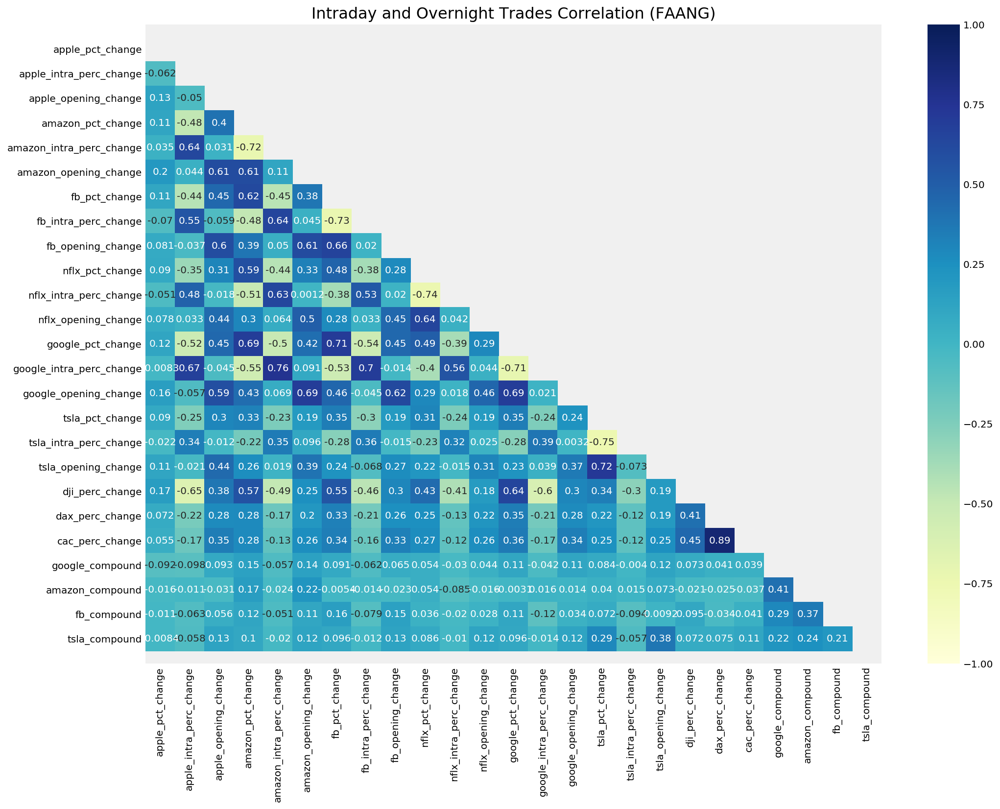

In [385]:
plt.figure(figsize = (15, 12))
plt.title('Intraday and Overnight Trades Correlation (FAANG, Index, Sentiment)', fontsize = 16)
selected = ['apple_pct_change','apple_intra_perc_change','apple_opening_change','amazon_pct_change','amazon_intra_perc_change','amazon_opening_change',
            'fb_pct_change','fb_intra_perc_change','fb_opening_change','nflx_pct_change','nflx_intra_perc_change','nflx_opening_change','google_pct_change', 
            'google_intra_perc_change','google_opening_change','tsla_pct_change', 
            'tsla_intra_perc_change','tsla_opening_change','dji_perc_change','dax_perc_change','cac_perc_change','google_compound',
            'amazon_compound', 'fb_compound','tsla_compound']
mask = np.zeros(faang_indexes_vadar[selected].corr().shape, dtype=bool)
mask[np.triu_indices(len(mask))] = True
ax = sns.heatmap(faang_indexes_vadar[selected].corr(),mask=mask ,vmin = -1, vmax = 1, cmap="YlGnBu", center = 0, annot = True)
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.xticks(rotation='90')
plt.show()

Amazon, Apple, Google, Netflix, Facebook are all highly correlated in terms of their intra percent change in stock price<br>

Tesla is not highly correlated and could be be used to diversify portfolio.

Generally headline news sentiment (measured by compound) is not highly correlated with share price changes. 
However, Tesla (0.31) show slightly higher correlations compared to its peers.


In [386]:
faang_indexes_vadar.to_csv('./datasets/preprocessed/faang_indexes_vadar.csv')


### Combining Vadar Sentiment Analysis Into Dataframe

In [387]:
cloud.drop(columns={'amazon_close', 'amazon_vol', 'amazon_previous_close', 'amazon_opening_change',
                       'amazon_opening_returns', 'amazon_target','amazon_intra_target','amazon_open_target', 
                       'amazon_intra_perc_change','amazon_intra_returns', 'amazon_pct_change','amazon_pct_returns'
                      }, inplace=True)

In [388]:
all_list= pd.merge(cloud,faang_indexes_vadar, how='inner', on='date')

### Creating an All List Dataframe

In [389]:
all_list.head()

,date,adobe_close,adobe_vol,adobe_intra_perc_change,adobe_intra_returns,adobe_pct_change,adobe_pct_returns,adobe_previous_close,adobe_opening_change,adobe_opening_returns,adobe_target,adobe_intra_target,adobe_open_target,cloudera_close,cloudera_vol,cloudera_intra_perc_change,cloudera_intra_returns,cloudera_pct_change,cloudera_pct_returns,cloudera_previous_close,cloudera_opening_change,cloudera_opening_returns,cloudera_target,cloudera_intra_target,cloudera_open_target,equinix_close,equinix_vol,equinix_intra_perc_change,equinix_intra_returns,equinix_pct_change,equinix_pct_returns,equinix_previous_close,equinix_opening_change,equinix_opening_returns,equinix_target,equinix_intra_target,equinix_open_target,fb_close,fb_vol,fb_intra_perc_change,fb_intra_returns,fb_pct_change,fb_pct_returns,fb_previous_close,fb_opening_change,fb_opening_returns,fb_target,fb_intra_target,fb_open_target,amazon_close,amazon_vol,amazon_intra_perc_change,amazon_intra_returns,amazon_pct_change,amazon_pct_returns,amazon_previous_close,amazon_opening_change,amazon_opening_returns,amazon_target,amazon_intra_target,amazon_open_target,apple_close,apple_vol,apple_intra_perc_change,apple_intra_returns,apple_pct_change,apple_pct_returns,apple_opening_change,apple_target,apple_intra_target,apple_open_target,nflx_close,nflx_vol,nflx_intra_perc_change,nflx_intra_returns,nflx_pct_change,nflx_pct_returns,nflx_previous_close,nflx_opening_change,nflx_opening_returns,nflx_target,nflx_intra_target,nflx_open_target,google_close,google_vol,google_intra_perc_change,google_intra_returns,google_pct_change,google_pct_returns,google_previous_close,google_opening_change,google_opening_returns,google_target,google_intra_target,google_open_target,tsla_close,tsla_vol,tsla_intra_perc_change,tsla_intra_returns,tsla_pct_change,tsla_pct_returns,tsla_previous_close,tsla_opening_change,tsla_opening_returns,tsla_target,tsla_intra_target,tsla_open_target,dji_open,dji_high,dji_low,dji_close,dji_vol,dji_perc_change,dji_return,dji_previous_day_return,dji_previous_perc_change,cac_open,cac_high,cac_low,cac_close,cac_vol,cac_perc_change,cac_return,dax_open,dax_high,dax_low,dax_close,dax_vol,dax_perc_change,dax_return,google_compound,google_sentiment,amazon_compound,amazon_sentiment,fb_compound,fb_neg,fb_neu,fb_pos,fb_sentiment,tsla_compound,tsla_sentiment,em_tweets3_compound,em_tweets3_sentiment
0,2017-04-28,133.74,1749200,-0.254873,1,0.002699,1,133.38,0.014995,1,1,-1,1,18.10,14871500,-1.685393,-1,NaN,-1,NaN,NaN,-1,-1,-1,-1,417.70,568400,-1.716790,-1,0.016450,1,410.94,-0.070570,-1,1,-1,-1,150.25,30652200,-0.501672,-1,0.017265,1,147.70,1.218687,1,1,-1,1,924.99,7364700,2.512568,1,0.007197,1,918.38,3.315621,1,1,1,1,143.65,20783460,0.305365,1,-0.019989,-1,0.208638,-1,1,1,152.20,6366200,0.333966,1,-0.005749,-1,153.08,-0.241704,-1,-1,1,-1,905.96,3276300,0.516109,1,0.036271,1,874.25,4.164713,1,1,1,1,314.070007,4505500,-1.368499,-1,0.017626,1,308.630005,0.388809,1,1,0,1,20987.390625,20987.759766,20926.750000,20940.509766,329990000,-0.223376,-1,-1.0,-0.046634,5267.660156,5287.850098,5265.359863,5267.330078,122645300,-0.006266,-1,12417.88965,12462.11035,12414.09961,12438.00977,101811900,0.162025,1,1.7180,1,1.9036,1,-0.4767,0.437,0.563,0.000,-1,0.0000,-1,-0.9741,-1
1,2017-05-04,134.61,1810500,0.384815,1,-0.001780,1,134.85,0.207638,1,-1,1,1,19.58,3256400,7.203791,1,-0.026839,-1,20.12,4.870775,1,-1,1,1,424.28,574900,-0.319202,-1,0.002599,1,423.18,-0.059077,-1,1,-1,-1,150.85,36225500,-0.452820,-1,-0.006258,-1,151.80,-1.073781,-1,-1,-1,-1,937.53,2418400,0.764223,1,-0.003719,-1,941.03,0.395312,1,-1,1,1,146.53,23345970,-0.006825,-1,-0.016313,-1,-0.367197,-1,-1,-1,157.25,5582300,-1.066907,-1,0.010669,1,155.59,0.000000,-1,1,-1,-1,931.66,1422100,-0.603626,-1,0.004984,1,927.04,-0.104634,-1,1,-1,-1,295.459991,14152000,3.896699,1,-0.050029,-1,311.019989,-1.151047,-1,-1,1,-1,20987.830078,20990.789063,20847.949219,20951.470703,274720000,-0.173240,-1,1.0,0.205118,5309.390137,5372.419922,5304.459961,5372.419922,152534000,1.1

In [390]:
all_list.T.head(100)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502
date,2017-04-28 00:00:00,2017-05-04 00:00:00,2017-05-05 00:00:00,2017-05-09 00:00:00,2017-05-10 00:00:00,2017-05-16 00:00:00,2017-05-17 00:00:00,2017-05-19 00:00:00,2017-05-23 00:00:00,2017-05-24 00:00:00,2017-05-25 00:00:00,2017-05-31 00:00:00,2017-06-01 00:00:00,2017-06-02 00:00:00,2017-06-07 00:00:00,2017-06-09 00:00:00,2017-06-13 00:00:00,2017-06-14 00:00:00,2017-06-19 00:00:00,2017-06-20 00:00:00,2017-06-21 00:00:00,2017-06-22 00:00:00,2017-06-26 00:00:00,2017-06-30 00:00:00,2017-07-03 00:00:00,2017-07-05 00:00:00,2017-07-06 00:00:00,2017-07-07 00:00:00,2017-07-11 00:00:00,2017-07-12 00:00:00,2017-07-13 00:00:00,2017-07-14 00:00:00,2017-07-19 00:00:00,2017-07-20 00:00:00,2017-07-21 00:00:00,2017-07-25 00:00:00,2017-07-28 00:00:00,2017-07-31 00:00:00,2017-08-01 00:00:00,2017-08-10 00:00:00,2017-08-11 00:00:00,2017-08-14 00:00:00,2017-08-18 00:00:00,2017-08-23 00:00:00,2017-08-25 00:00:00,2017-08-29 00:00:00,2017-08-30 00:00:00,2017-08-31 00:00:00,2017-09-12 00:00:00,2017-09-13 00:00:00,2017-09-14 00:00:00,2017-09-15 00:00:00,2017-09-19 00:00:00,2017-09-20 00:00:00,2017-09-25 00:00:00,2017-09-26 00:00:00,2017-09-27 00:00:00,2017-09-28 00:00:00,2017-09-29 00:00:00,2017-10-02 00:00:00,2017-10-04 00:00:00,2017-10-05 00:00:00,2017-10-06 00:00:00,2017-10-09 00:00:00,2017-10-11 00:00:00,2017-10-12 00:00:00,2017-10-18 00:00:00,2017-10-19 00:00:00,2017-10-20 00:00:00,2017-10-24 00:00:00,2017-11-08 00:00:00,2017-11-09 00:00:00,2017-11-10 00:00:00,2017-11-21 00:00:00,2017-11-24 00:00:00,2017-11-27 00:00:00,2017-11-28 00:00:00,2017-12-08 00:00:00,2017-12-11 00:00:00,2017-12-12 00:00:00,2017-12-14 00:00:00,2017-12-15 00:00:00,2017-12-19 00:00:00,2017-12-20 00:00:00,2017-12-21 00:00:00,2017-12-27 00:00:00,2018-01-08 00:00:00,2018-01-09 00:00:00,2018-01-12 00:00:00,2018-01-24 00:00:00,2018-01-29 00:00:00,2018-01-30 00:00:00,2018-02-01 00:00:00,2018-02-02 00:00:00,2018-02-05 00:00:00,2018-02-06 00:00:00,2018-02-16 00:00:00,2018-02-21 00:00:00,2018-02-28 00:00:00,2018-03-05 00:00:00,2018-03-06 00:00:00,2018-03-08 00:00:00,2018-03-09 00:00:00,2018-03-12 00:00:00,2018-03-14 0

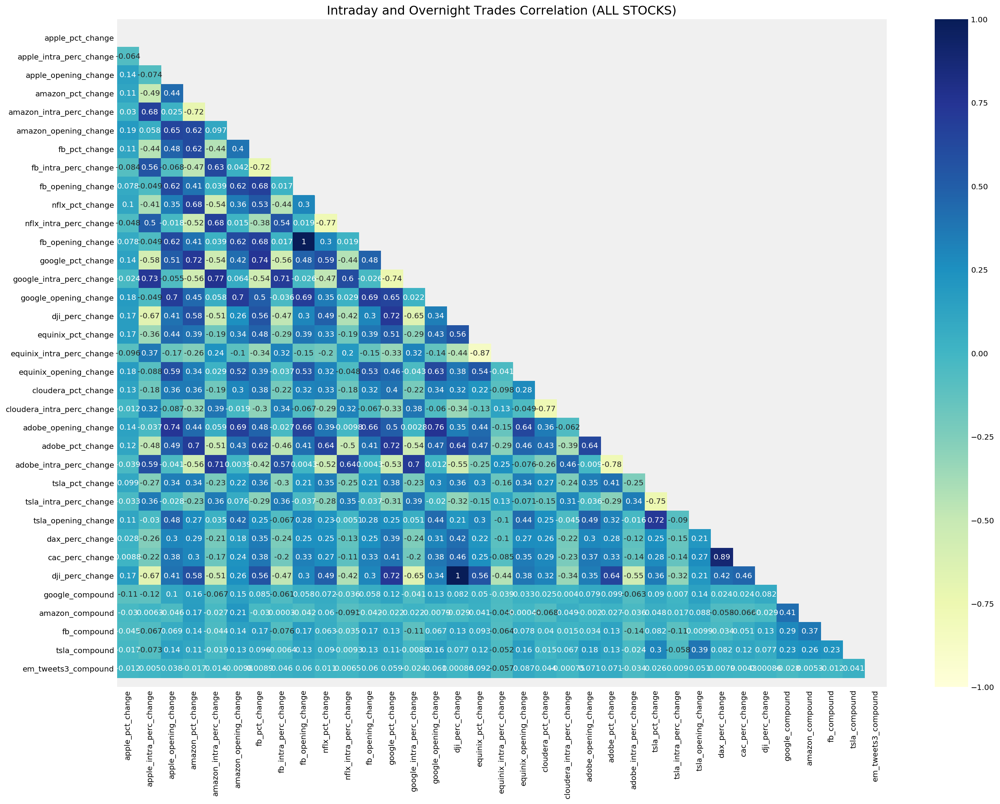

In [391]:
plt.figure(figsize = (20, 16))
plt.title('Intraday and Overnight Trades Correlation (ALL STOCKS & SENTIMENT)', fontsize = 16)
selected = ['apple_pct_change','apple_intra_perc_change','apple_opening_change','amazon_pct_change','amazon_intra_perc_change','amazon_opening_change',
            'fb_pct_change','fb_intra_perc_change','fb_opening_change','nflx_pct_change','nflx_intra_perc_change','fb_opening_change','google_pct_change', 
            'google_intra_perc_change','google_opening_change','dji_perc_change','equinix_pct_change','equinix_intra_perc_change','equinix_opening_change', 
            'cloudera_pct_change','cloudera_intra_perc_change','adobe_opening_change',
            'adobe_pct_change','adobe_intra_perc_change', 'tsla_pct_change','tsla_intra_perc_change','tsla_opening_change','dax_perc_change','cac_perc_change',
            'dji_perc_change','google_compound',
            'amazon_compound', 'fb_compound','tsla_compound', 'em_tweets3_compound']
mask = np.zeros(all_list[selected].corr().shape, dtype=bool)
mask[np.triu_indices(len(mask))] = True
ax = sns.heatmap(all_list[selected].corr(),mask=mask ,vmin = -1, vmax = 1, cmap="YlGnBu", center = 0, annot = True)
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.xticks(rotation='90')
plt.show()

Most US stocks are hardly affected by the European indexes which open slightly earlier. Stocks which are slightly more affected than their stock peers are Google and Adobe, likely due to market presence in Europe.

In [393]:
#Saving the file for future analysis

all_list.to_csv('./datasets/preprocessed/all_list.csv')

In [394]:
all_list.head()

,date,adobe_close,adobe_vol,adobe_intra_perc_change,adobe_intra_returns,adobe_pct_change,adobe_pct_returns,adobe_previous_close,adobe_opening_change,adobe_opening_returns,adobe_target,adobe_intra_target,adobe_open_target,cloudera_close,cloudera_vol,cloudera_intra_perc_change,cloudera_intra_returns,cloudera_pct_change,cloudera_pct_returns,cloudera_previous_close,cloudera_opening_change,cloudera_opening_returns,cloudera_target,cloudera_intra_target,cloudera_open_target,equinix_close,equinix_vol,equinix_intra_perc_change,equinix_intra_returns,equinix_pct_change,equinix_pct_returns,equinix_previous_close,equinix_opening_change,equinix_opening_returns,equinix_target,equinix_intra_target,equinix_open_target,fb_close,fb_vol,fb_intra_perc_change,fb_intra_returns,fb_pct_change,fb_pct_returns,fb_previous_close,fb_opening_change,fb_opening_returns,fb_target,fb_intra_target,fb_open_target,amazon_close,amazon_vol,amazon_intra_perc_change,amazon_intra_returns,amazon_pct_change,amazon_pct_returns,amazon_previous_close,amazon_opening_change,amazon_opening_returns,amazon_target,amazon_intra_target,amazon_open_target,apple_close,apple_vol,apple_intra_perc_change,apple_intra_returns,apple_pct_change,apple_pct_returns,apple_opening_change,apple_target,apple_intra_target,apple_open_target,nflx_close,nflx_vol,nflx_intra_perc_change,nflx_intra_returns,nflx_pct_change,nflx_pct_returns,nflx_previous_close,nflx_opening_change,nflx_opening_returns,nflx_target,nflx_intra_target,nflx_open_target,google_close,google_vol,google_intra_perc_change,google_intra_returns,google_pct_change,google_pct_returns,google_previous_close,google_opening_change,google_opening_returns,google_target,google_intra_target,google_open_target,tsla_close,tsla_vol,tsla_intra_perc_change,tsla_intra_returns,tsla_pct_change,tsla_pct_returns,tsla_previous_close,tsla_opening_change,tsla_opening_returns,tsla_target,tsla_intra_target,tsla_open_target,dji_open,dji_high,dji_low,dji_close,dji_vol,dji_perc_change,dji_return,dji_previous_day_return,dji_previous_perc_change,cac_open,cac_high,cac_low,cac_close,cac_vol,cac_perc_change,cac_return,dax_open,dax_high,dax_low,dax_close,dax_vol,dax_perc_change,dax_return,google_compound,google_sentiment,amazon_compound,amazon_sentiment,fb_compound,fb_neg,fb_neu,fb_pos,fb_sentiment,tsla_compound,tsla_sentiment,em_tweets3_compound,em_tweets3_sentiment
0,2017-04-28,133.74,1749200,-0.254873,1,0.002699,1,133.38,0.014995,1,1,-1,1,18.10,14871500,-1.685393,-1,NaN,-1,NaN,NaN,-1,-1,-1,-1,417.70,568400,-1.716790,-1,0.016450,1,410.94,-0.070570,-1,1,-1,-1,150.25,30652200,-0.501672,-1,0.017265,1,147.70,1.218687,1,1,-1,1,924.99,7364700,2.512568,1,0.007197,1,918.38,3.315621,1,1,1,1,143.65,20783460,0.305365,1,-0.019989,-1,0.208638,-1,1,1,152.20,6366200,0.333966,1,-0.005749,-1,153.08,-0.241704,-1,-1,1,-1,905.96,3276300,0.516109,1,0.036271,1,874.25,4.164713,1,1,1,1,314.070007,4505500,-1.368499,-1,0.017626,1,308.630005,0.388809,1,1,0,1,20987.390625,20987.759766,20926.750000,20940.509766,329990000,-0.223376,-1,-1.0,-0.046634,5267.660156,5287.850098,5265.359863,5267.330078,122645300,-0.006266,-1,12417.88965,12462.11035,12414.09961,12438.00977,101811900,0.162025,1,1.7180,1,1.9036,1,-0.4767,0.437,0.563,0.000,-1,0.0000,-1,-0.9741,-1
1,2017-05-04,134.61,1810500,0.384815,1,-0.001780,1,134.85,0.207638,1,-1,1,1,19.58,3256400,7.203791,1,-0.026839,-1,20.12,4.870775,1,-1,1,1,424.28,574900,-0.319202,-1,0.002599,1,423.18,-0.059077,-1,1,-1,-1,150.85,36225500,-0.452820,-1,-0.006258,-1,151.80,-1.073781,-1,-1,-1,-1,937.53,2418400,0.764223,1,-0.003719,-1,941.03,0.395312,1,-1,1,1,146.53,23345970,-0.006825,-1,-0.016313,-1,-0.367197,-1,-1,-1,157.25,5582300,-1.066907,-1,0.010669,1,155.59,0.000000,-1,1,-1,-1,931.66,1422100,-0.603626,-1,0.004984,1,927.04,-0.104634,-1,1,-1,-1,295.459991,14152000,3.896699,1,-0.050029,-1,311.019989,-1.151047,-1,-1,1,-1,20987.830078,20990.789063,20847.949219,20951.470703,274720000,-0.173240,-1,1.0,0.205118,5309.390137,5372.419922,5304.459961,5372.419922,152534000,1.1